In [1]:
import numpy as np
import pandas as pd
from scipy.io import *
from pylab import *
from scipy.signal import *
import scipy.signal as signal


In [2]:
df_average = pd.read_csv('Merged_100_2_10.csv', sep=',')
# df_hpc_mutation = pd.read_csv('../HPC_mutation_100_2_10.csv', sep=',')
# df_pfc_mutation = pd.read_csv('../PFC_mutation_100_2_10.csv', sep=',')
# df_hpc_control = pd.read_csv('../HPC_control_100_2_10.csv', sep=',')
# df_pfc_control= pd.read_csv('../PFC_control_100_2_10.csv', sep=',')


In [5]:
df_average.sort_values('Rat')

,Rat,Condition,Epoch,MC,Region,Spectral Analysis Power,Spectral Analysis Frequency,REM_Data
0,1,HomeCage,1,Control,PFC,"[-9.699299591056791, 0.0, -0.5695222071837501,...","[0.0, 1.9249278152069298, 3.8498556304138596, ...","[162.66886016084297, 145.2124747611281, 126.81..."
89,1,HomeCage,6,Control,HPC,"[-40.49282345453343, -27.438868501764297, -27....","[0.0, 2.2002200220022, 4.4004400440044, 6.6006...","[-560.2653773557522, -564.7518477368295, -582...."
88,1,HomeCage,5,Control,HPC,"[-43.75049382682161, -29.238968494263958, -25....","[0.0, 0.9573958831977023, 1.9147917663954046, ...","[-198.02360643307728, -329.19500698778336, -46..."
87,1,HomeCage,4,Control,HPC,"[-38.96894592733365, -25.59935584363149, -23.8...","[0.0, 1.6680567139282736, 3.336113427856547, 5...","[92.42762885682333, 119.36983492345472, 100.41..."
86,1,HomeCage,3,Control,HPC,"[-28.011871045030276, -13.119754478669169, -13...","[0.0, 3.179650238473768, 6.359300476947536, 9....","[-12.067703388070962, -12.030385778472908, -41..."
...,...,...,...,...,...,...,...,...
77,9,HomeCage,3,Control,PFC,"[-17.292442928724366, -2.4908133584306267, 0.0...","[0.0, 1.6680567139282736, 3.336113427856547, 5...","[93.59687996705937, 80.88946689317804, 93.7643..."
76,9,HomeCage,2,Control,PFC,"[-16.24299916530188, -3.1431791913978415, 0.0,...","[0.0, 1.0995052226498077, 2.1990104452996153, ...","[65.55700825497907, 54.08391836784075, 19.5961..."
75,9,HomeCage,1,Control,PFC,"[-17.604002267022352, -3.5315700999069346, -0....","[0.0, 1.2277470841006752, 2.4554941682013505, ...","[-16.630605371703197, -40.363494999232195, -71..."
166,9,HomeCage,8,Control,HPC,"[-37.30470643897209, -23.736441907913854, -23....","[0.0, 2.2753128555176336, 4.550625711035267, 6...","[-224.25588176769233, -229.05728211489492, -23..."


In [3]:
def spikes(rat, e,region,specp,specf, data, theta,slowgamma, mediumgamma, fastgamma):
    extrema =specf[argrelextrema(specp, np.greater)]
    check_low = np.inf 
    check_high=0
    fNQ= 500
    plot(data, label='REM Data')
    if theta:
        theta_lower  = t_lower =4
        theta_upper= t_higher=12
        for theta_e in extrema:
            if theta_e >=theta_lower and theta_e< theta_upper:
                if theta_e < check_low:
                    check_low = theta_e
                    t_lower =theta_e
                elif theta_e > check_high:
                    check_high = theta_e
                    t_higher =theta_e
        Wn = [t_lower, t_higher];                     # Set the passband [80-120] Hz,
        n = 100;                            # ... and filter order,
        b = signal.firwin(n, Wn, nyq=fNQ, pass_zero=False, window='hamming');       
        Vlo = signal.filtfilt(b, 1, data);   # ... and apply it to the data.
        plot(range(len(data)), Vlo, label='Theta')
    if slowgamma:
        check_low = np.inf 
        check_high=0
        slowgamma_lower = t_lower=25 
        slowgamma_upper = t_higher=59
        for slowgamma_e in extrema:
            if slowgamma_e >=slowgamma_lower and slowgamma_e< slowgamma_upper:
                if slowgamma_e < check_low:
                    check_low = slowgamma_e
                    t_lower =slowgamma_e
                elif slowgamma_e > check_high:
                    check_high = slowgamma_e
                    t_higher =slowgamma_e
        Wn = [t_lower, t_higher];                     # Set the passband [80-120] Hz,
        n = 100;                            # ... and filter order,
        b = signal.firwin(n, Wn, nyq=fNQ, pass_zero=False, window='hamming');       
        Vhi = signal.filtfilt(b, 1, data);   # ... and apply it to the data.
        plot(range(len(data)), Vhi, label='Slow Gamma')
    if mediumgamma:
        check_low = np.inf 
        check_high=0
        mediumgamma_lower = t_lower=60
        mediumgamma_upper = t_higher=119
        for mediumgamma_e in extrema:
            if mediumgamma_e >=mediumgamma_lower and mediumgamma_e< mediumgamma_upper:
                if mediumgamma_e < check_low:
                    check_low = mediumgamma_e
                    t_lower =mediumgamma_e
                elif mediumgamma_e > check_high:
                    check_high = mediumgamma_e
                    t_higher =mediumgamma_e
        Wn = [t_lower, t_higher];                     # Set the passband [80-120] Hz,
        n = 100;                            # ... and filter order,
                                    # ... build the bandpass filter,
        b = signal.firwin(n, Wn, nyq=fNQ, pass_zero=False, window='hamming');       
        Vha = signal.filtfilt(b, 1, data);   # ... and apply it to the data.
        plot(range(len(data)), Vha, label='Medium Gamma')
    if fastgamma:
        check_low = np.inf 
        fastgamma_lower = t_lower= 120
        t_higher= 500
        for fastgamma_e in extrema:
            if fastgamma_e >=fastgamma_lower :
                if fastgamma_e < check_low:
                    check_low = fastgamma_e
                    t_lower =fastgamma_e

        Wn = [t_lower, t_higher];                     # Set the passband [80-120] Hz,
        n = 100;                            # ... and filter order,
        fNQ = t_higher*2
                                    # ... build the bandpass filter,
        b = signal.firwin(n, Wn, nyq=fNQ, pass_zero=False, window='hamming');       
        Vhu = signal.filtfilt(b, 1, data);   # ... and apply it to the data.
        fg=plot(range(len(data)), Vhu, label='Fast Gamma')
    xlim([200, 800])                  # Set freq. range, 
    xlabel('Time [ms]')
    legend()
    savefig('Rat%s_%s_Filtered'%(rat,region))
    show()
    return {'Rat':rat, 'Epoch':e,'Region': region,'Theta':Vlo.tolist(), 'Slow_Gamma':Vhi.tolist(), \
            'Medium_Gamma':Vha.tolist(), 'Fast_Gamma':Vhu.tolist(), 'Rem_Data':data}

In [5]:
df_filtered= pd.DataFrame(columns =['Rat','Epoch', 'Region','MC','Theta', 'Slow_Gamma', 'Medium_Gamma', 'Fast_Gamma', 'REM_Data'])
df_filtered['Theta']=df_filtered['Theta'].astype(object)
df_filtered['Slow_Gamma']=df_filtered['Slow_Gamma'].astype(object)
df_filtered['Medium_Gamma']=df_filtered['Medium_Gamma'].astype(object)
df_filtered['Fast_Gamma']=df_filtered['Fast_Gamma'].astype(object)
df_filtered['REM_Data']=df_filtered['REM_Data'].astype(object)

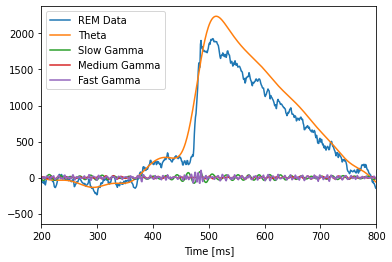

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


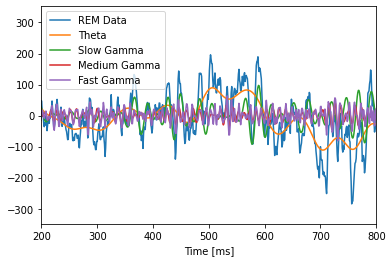

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


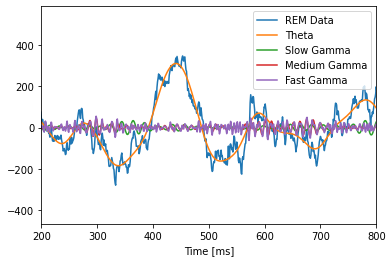

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


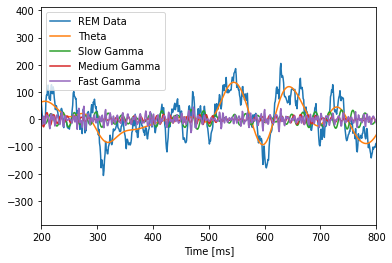

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


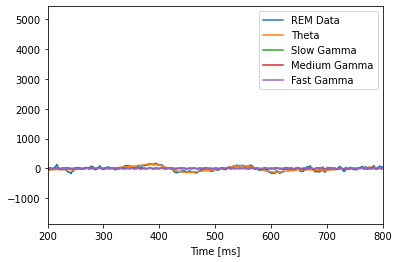

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


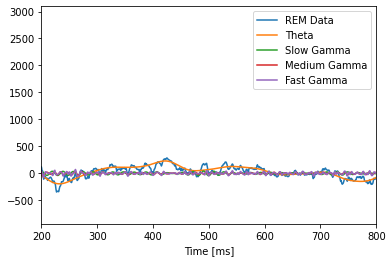

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


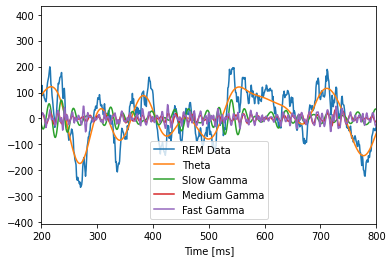

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


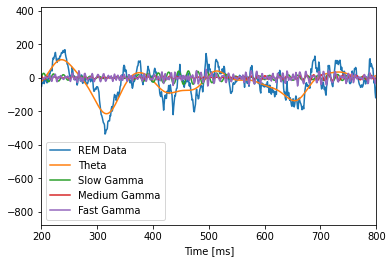

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


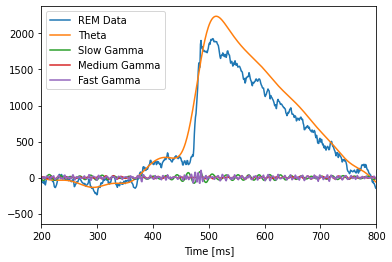

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


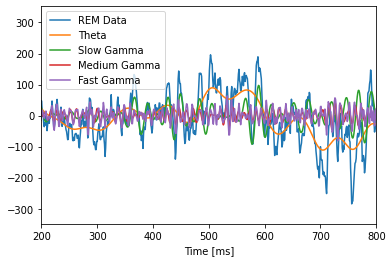

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


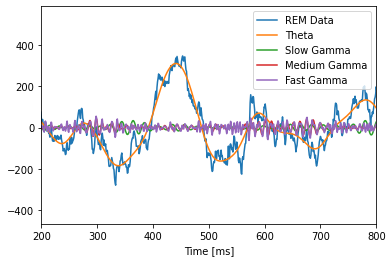

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


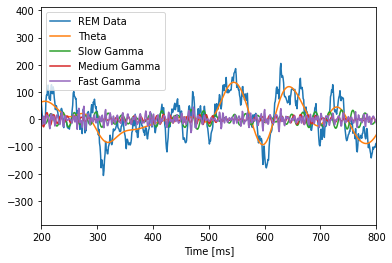

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


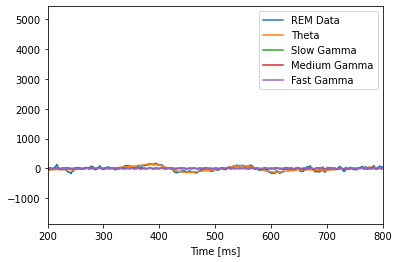

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


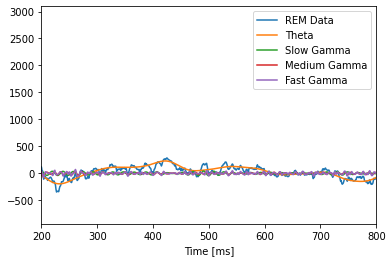

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


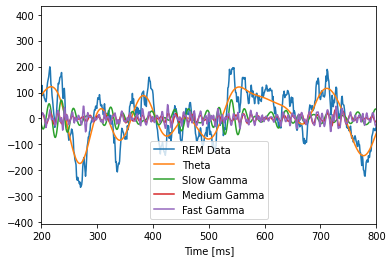

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


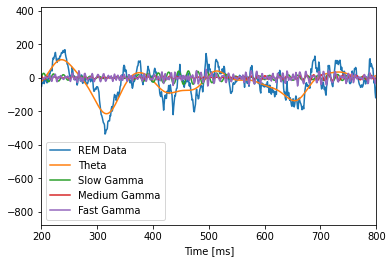

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


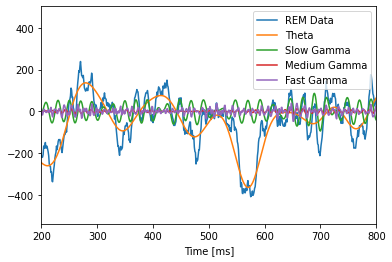

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


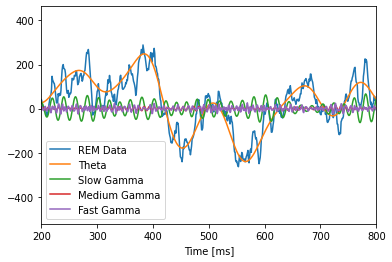

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


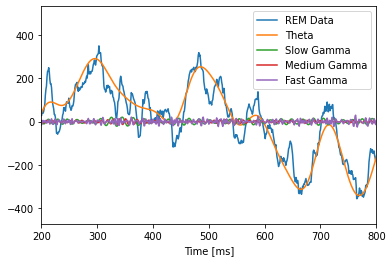

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


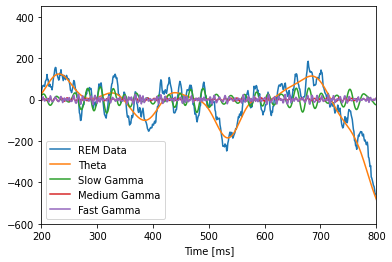

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


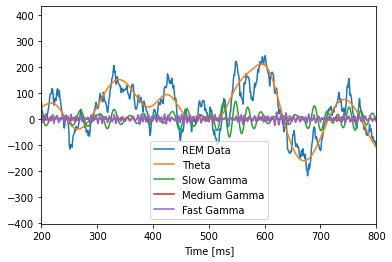

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


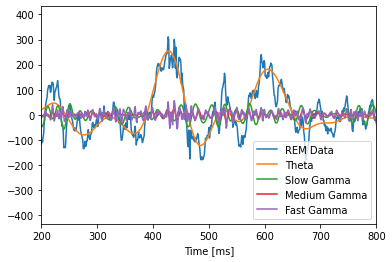

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


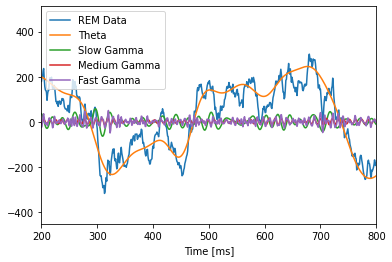

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


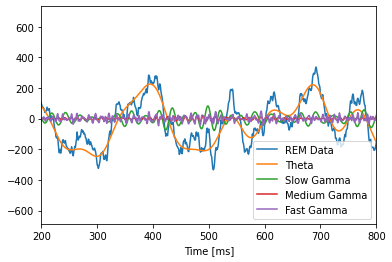

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


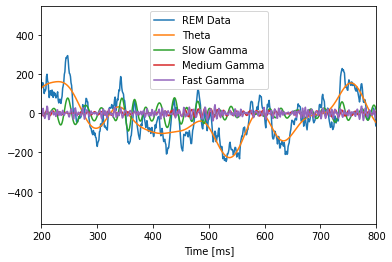

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


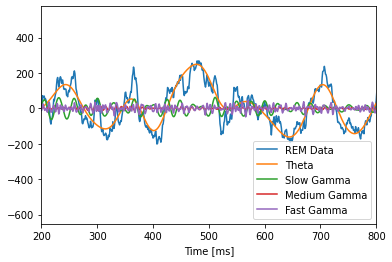

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


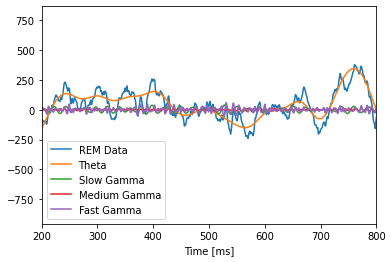

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


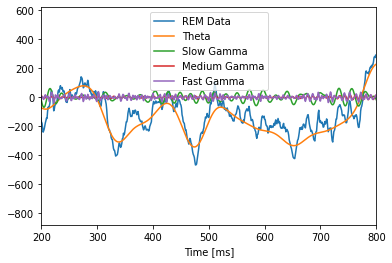

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


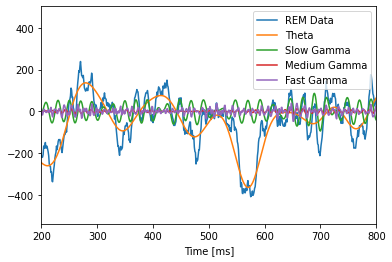

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


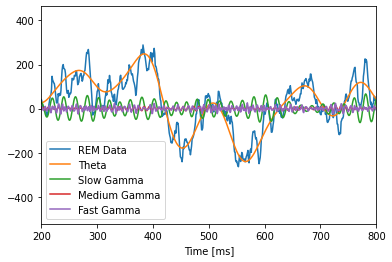

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


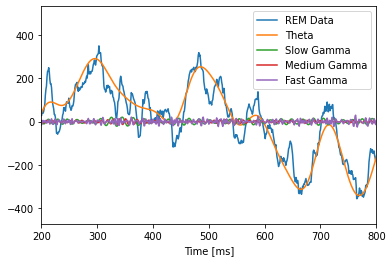

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


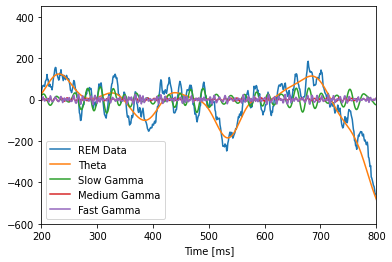

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


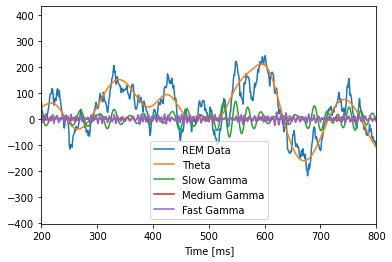

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


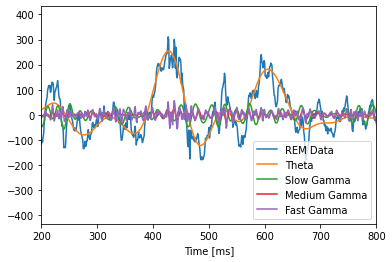

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


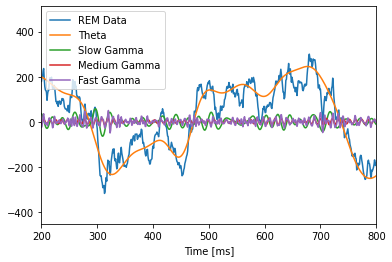

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


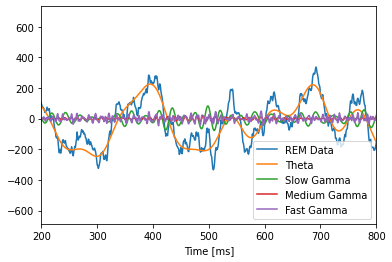

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


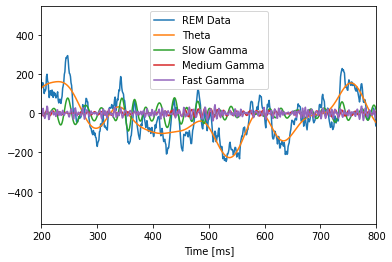

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


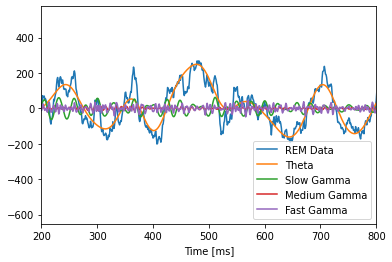

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


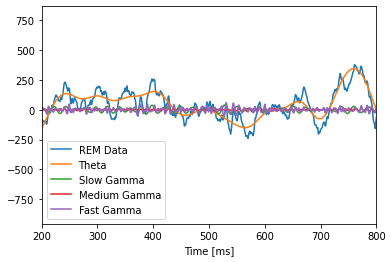

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


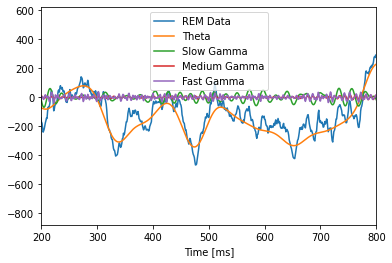

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


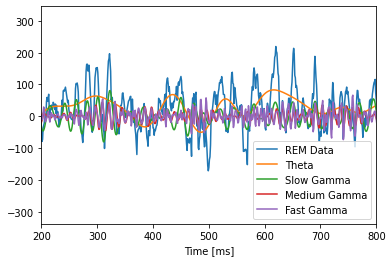

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


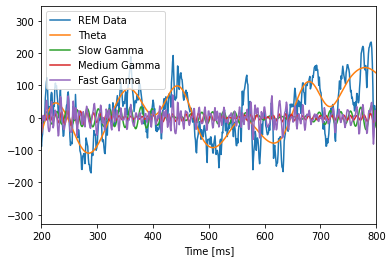

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


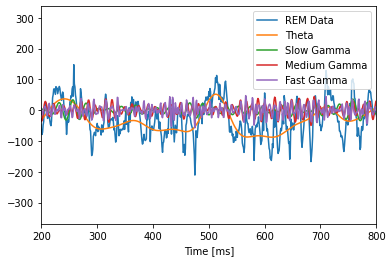

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


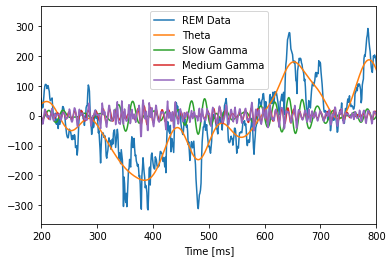

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


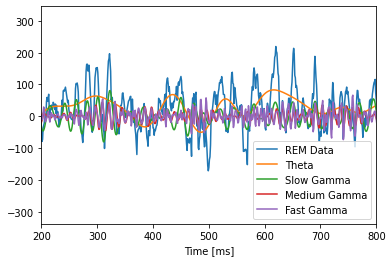

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


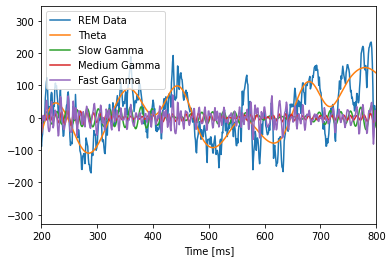

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


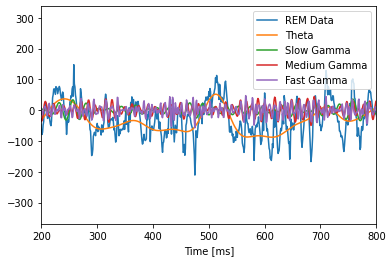

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


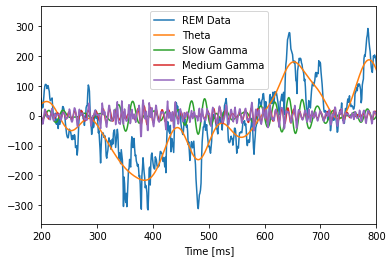

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


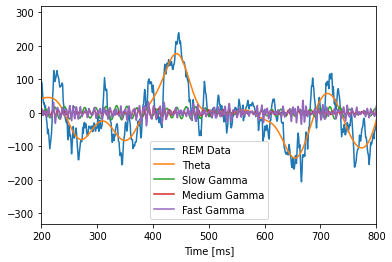

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


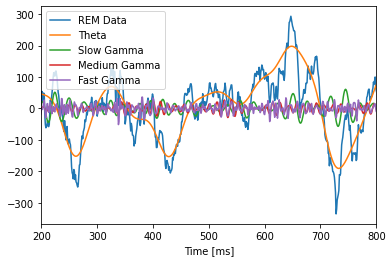

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


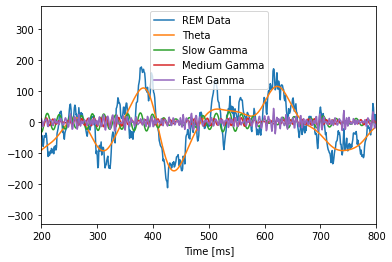

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


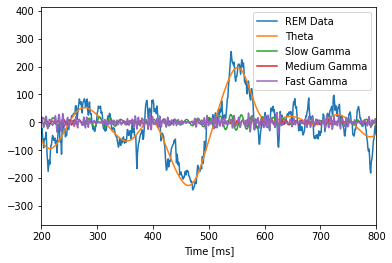

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


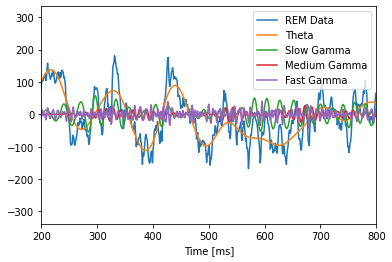

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


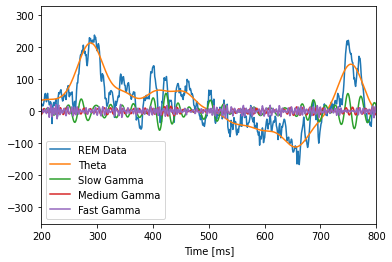

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


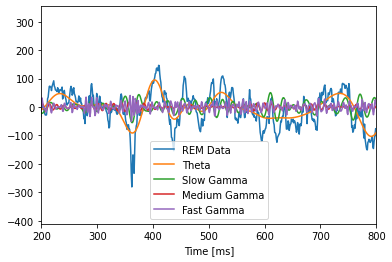

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


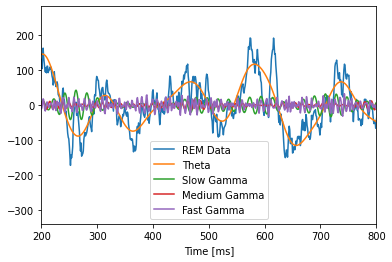

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


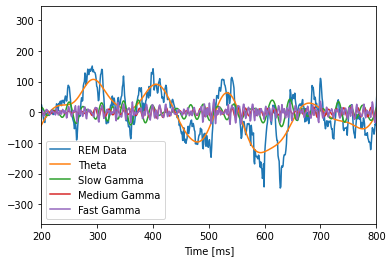

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


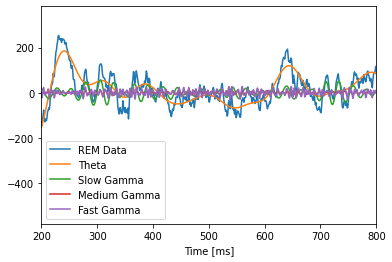

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


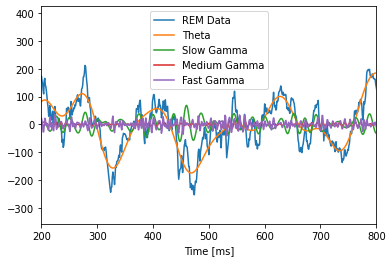

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


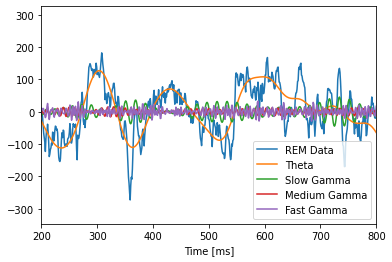

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


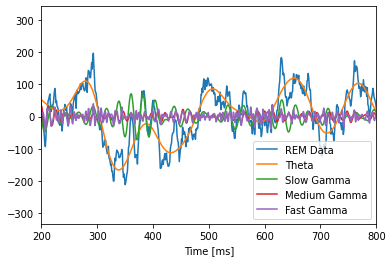

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


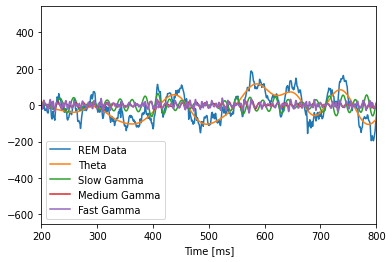

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


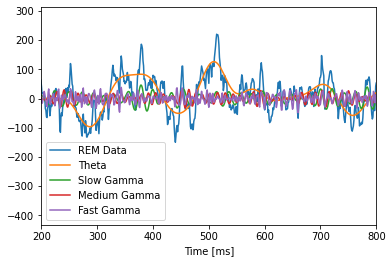

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


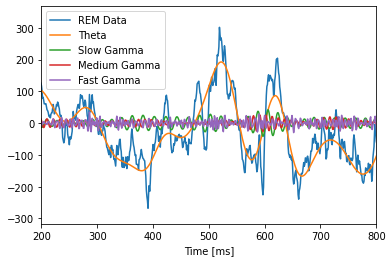

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


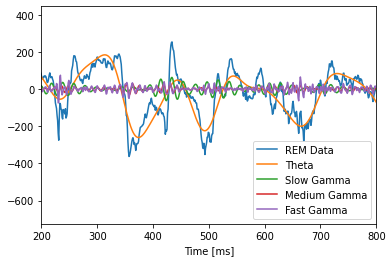

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


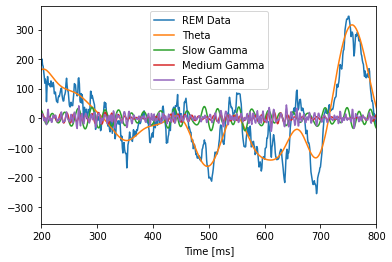

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


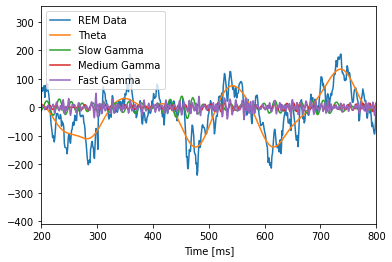

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


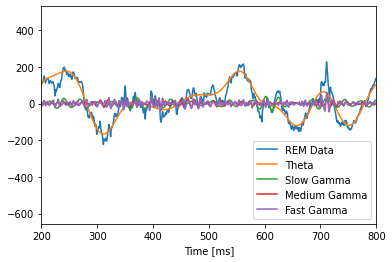

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


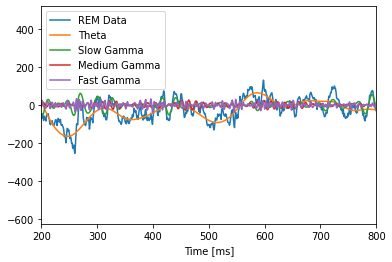

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


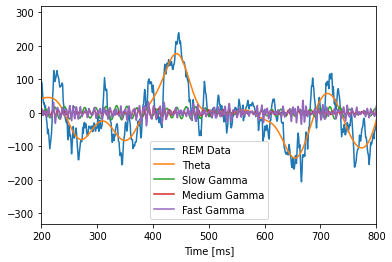

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


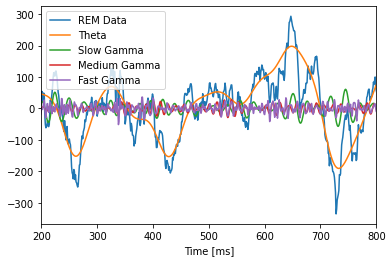

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


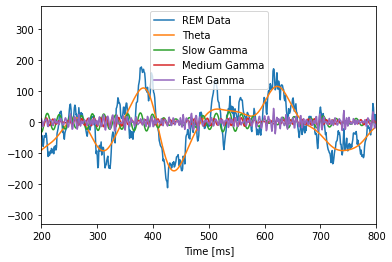

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


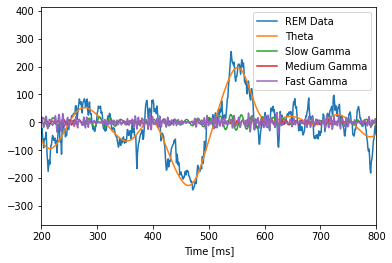

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


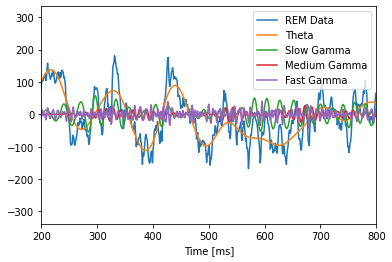

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


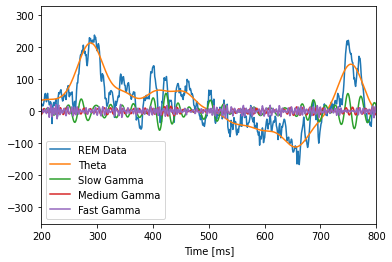

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


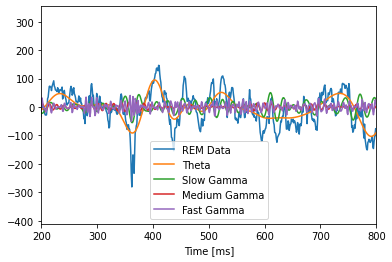

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


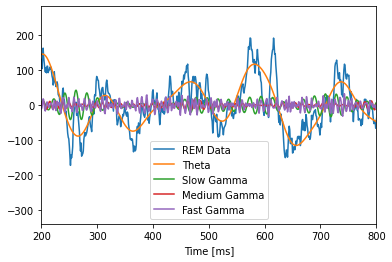

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


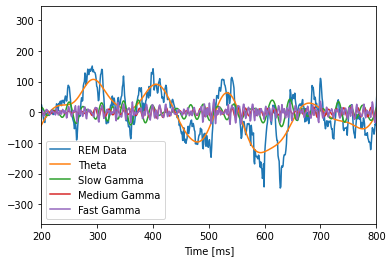

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


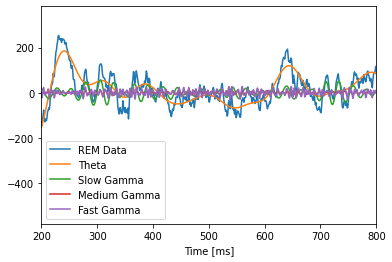

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


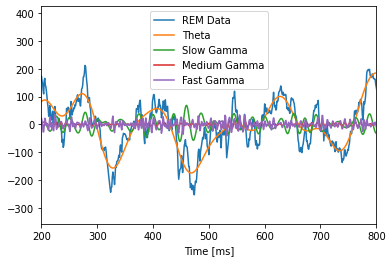

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


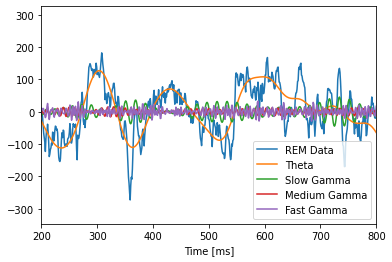

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


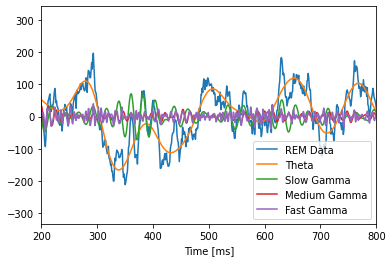

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


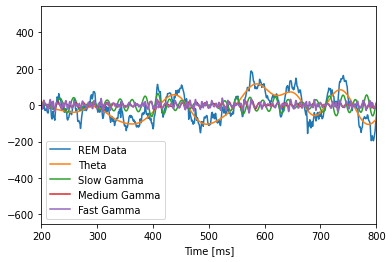

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


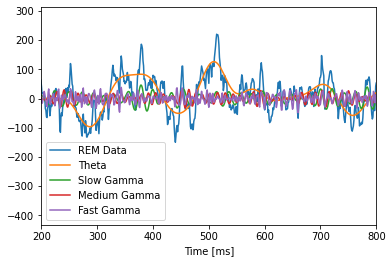

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


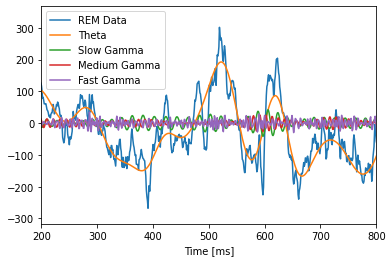

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


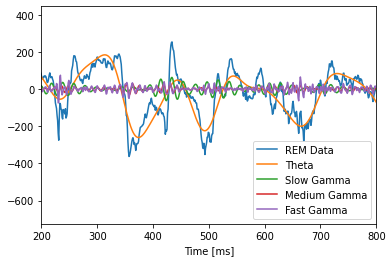

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


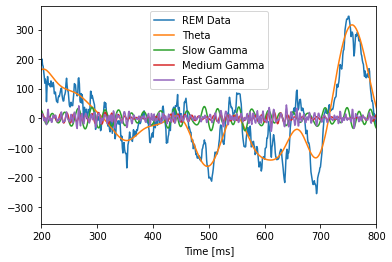

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


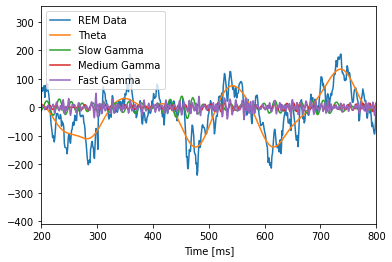

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


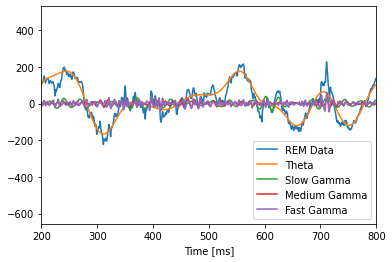

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


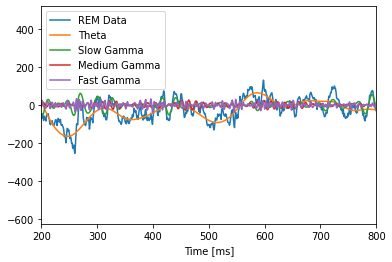

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


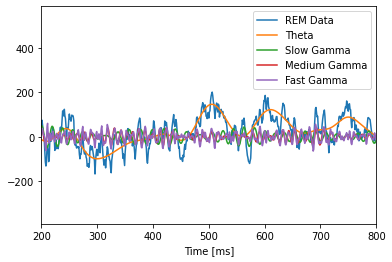

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


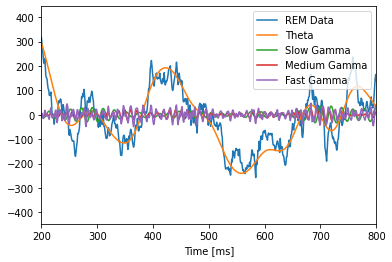

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


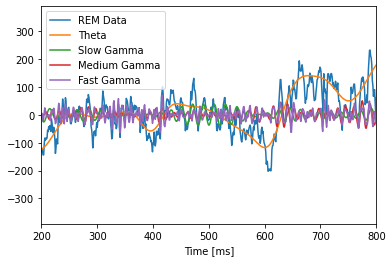

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


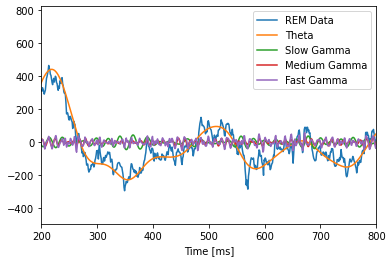

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


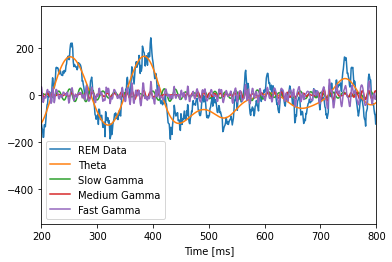

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


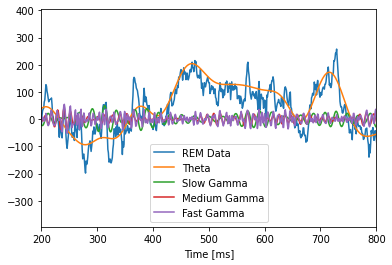

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


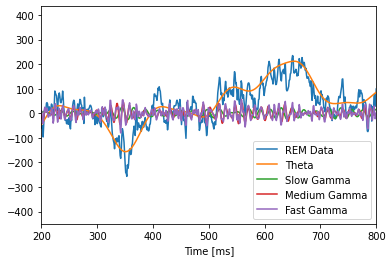

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


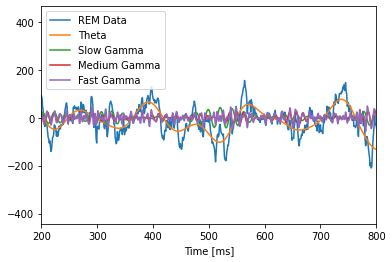

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


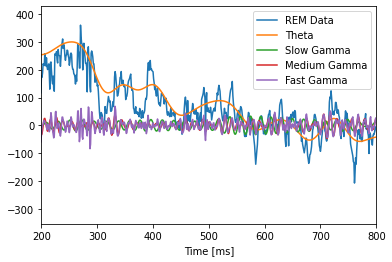

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


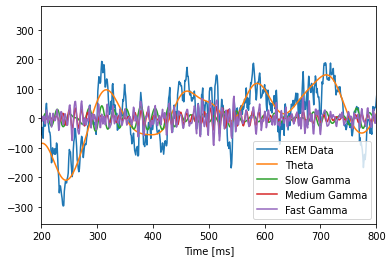

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


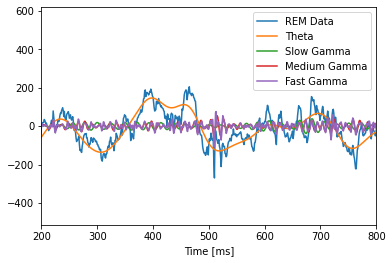

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


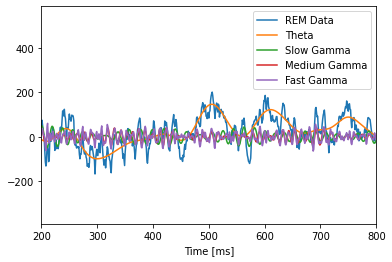

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


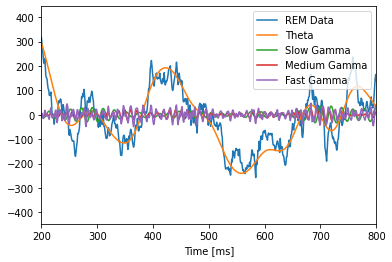

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


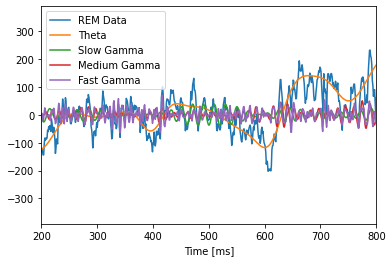

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


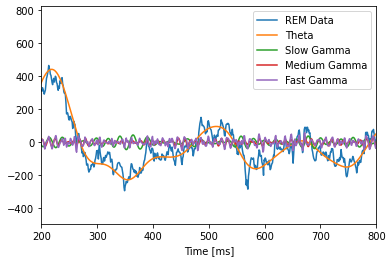

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


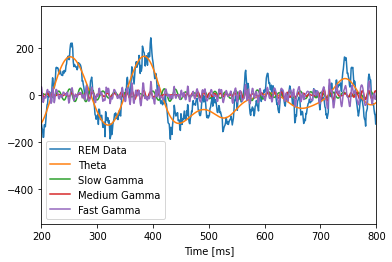

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


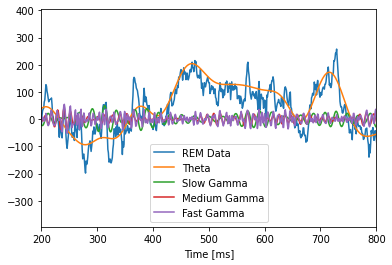

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


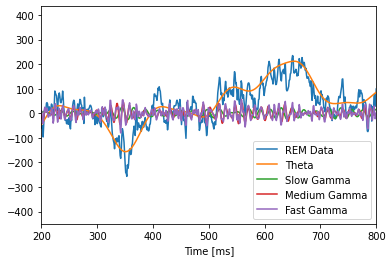

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


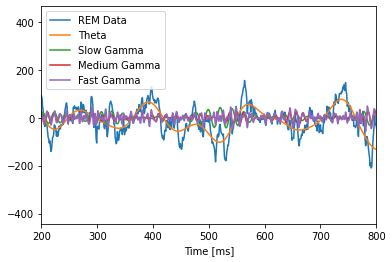

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


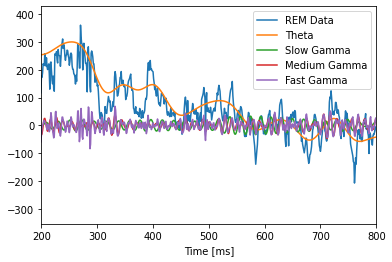

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


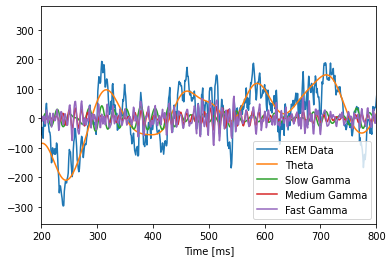

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


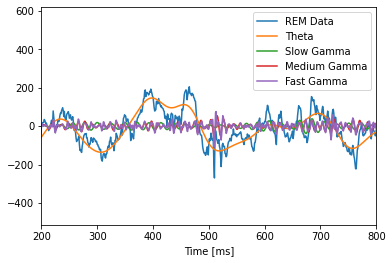

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


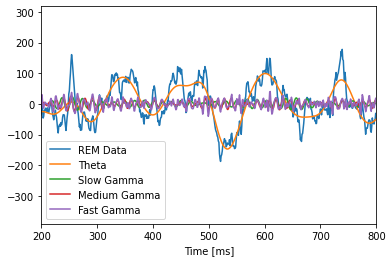

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


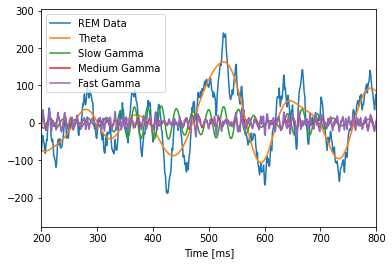

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


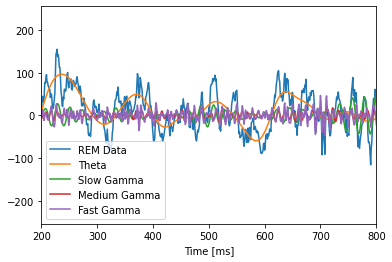

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


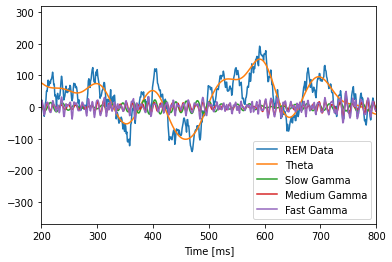

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


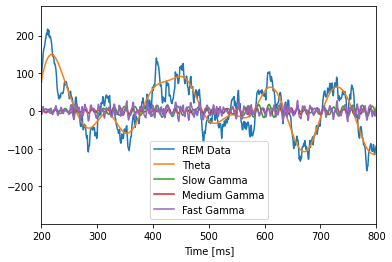

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


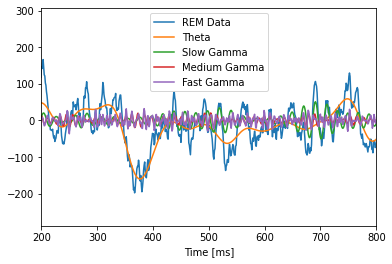

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


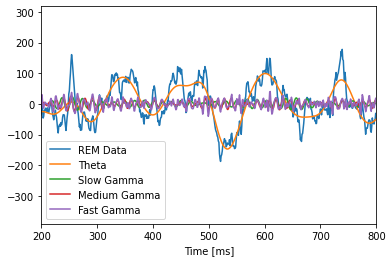

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


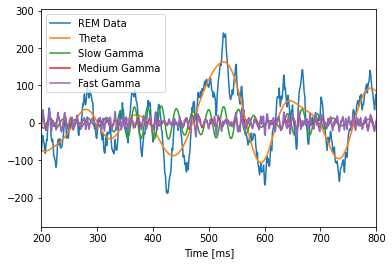

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


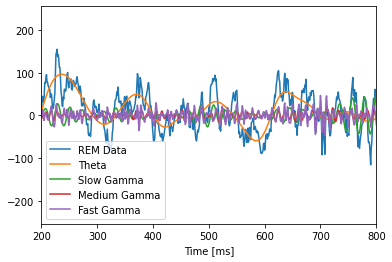

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


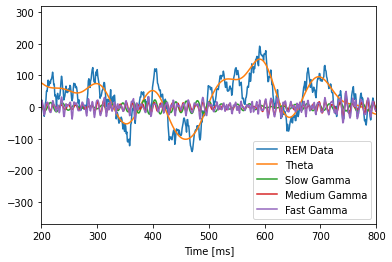

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


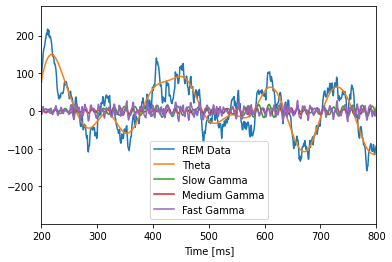

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


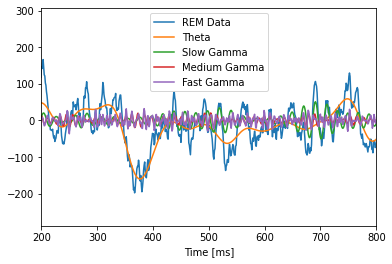

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


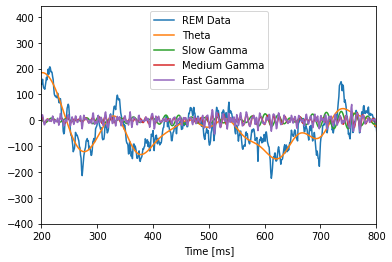

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


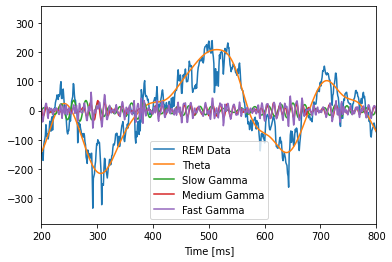

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


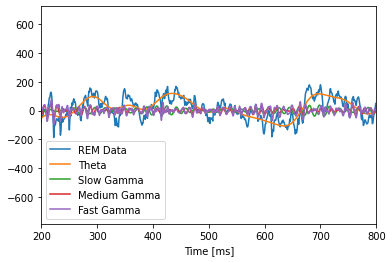

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


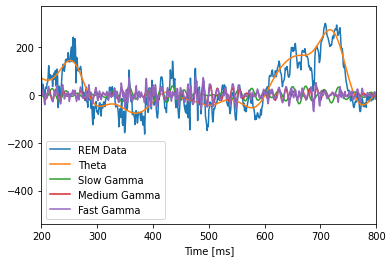

/tmp/ipykernel_79482/3481364810.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


In [ ]:
for rat in range(1,10):
    if rat!=5:
        epochs = df_average.loc[(df_average.Rat==rat),'Epoch']
        for e in epochs:
            specp = df_average.loc[((df_average.Rat==rat)&(df_average.Epoch==e) & (df_average.Region=='PFC')), 'Spectral Analysis Power'].values[0]
            specp = np.array([float(num) for num in specp.split(',')[1:-1]])
#             print(specp[0])
            specf =df_average.loc[((df_average.Rat==rat) &(df_average.Epoch==e) & (df_average.Region=='PFC')),'Spectral Analysis Frequency'].values[0]
            specf =  np.array([float(num) for num in specf.split(',')[1:-1]])
            data = df_average.loc[((df_average.Rat==rat) &(df_average.Epoch==e) & (df_average.Region=='PFC')),'REM_Data'].values[0]
            data =  [float(num) for num in data.split(',')[1:-1]]
            theta =True
            slowgamma = True
            mediumgamma = True
            fastgamma = True
            df_filtered=df_filtered.append(spikes(rat,e,'PFC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


Rat 1


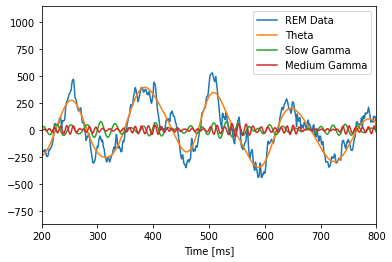

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


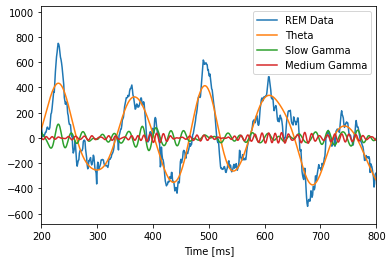

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


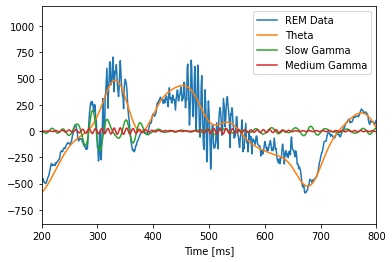

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


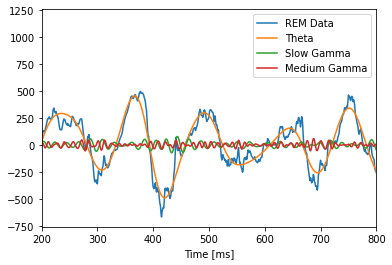

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


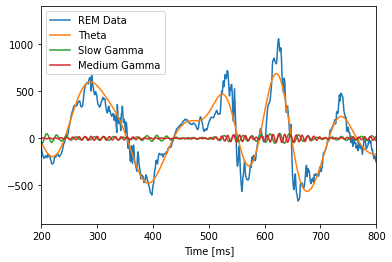

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


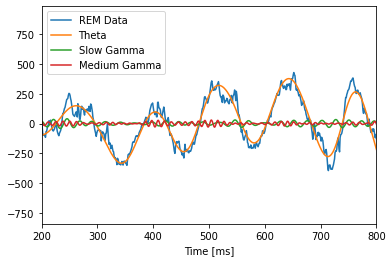

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


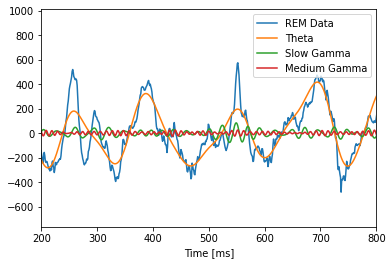

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


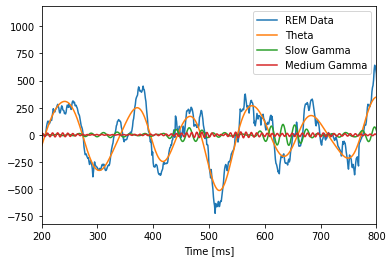

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


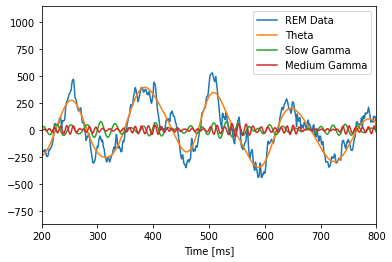

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


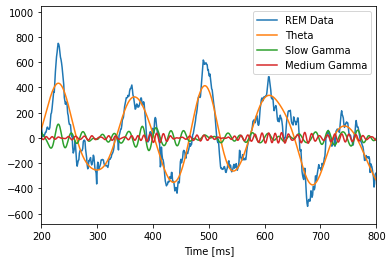

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


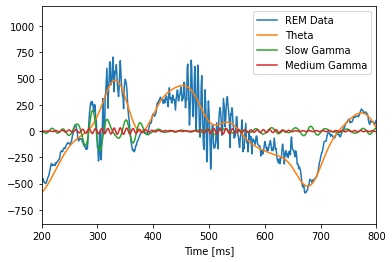

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


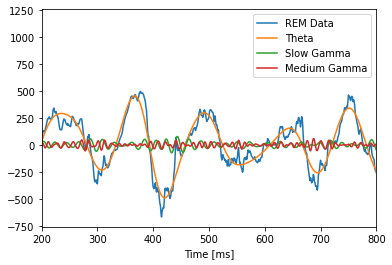

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


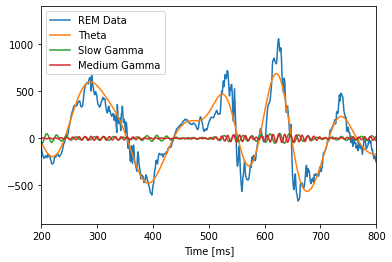

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


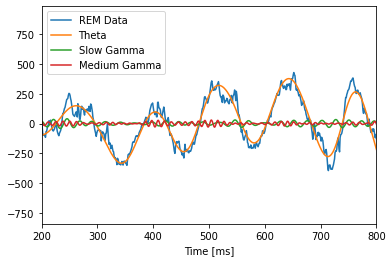

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


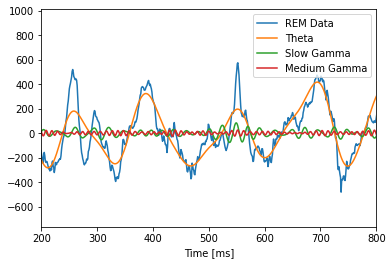

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


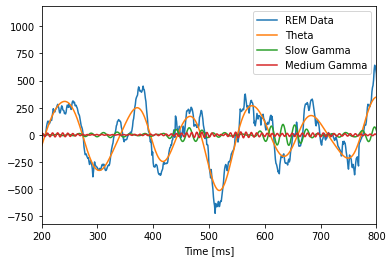

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


Rat 2


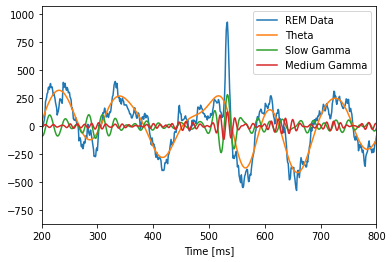

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


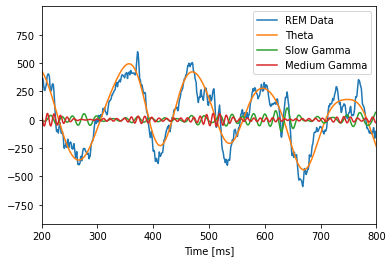

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


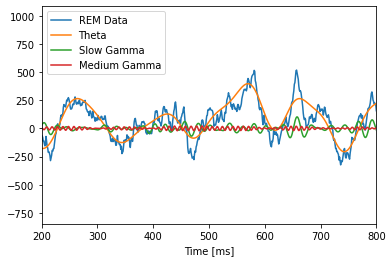

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


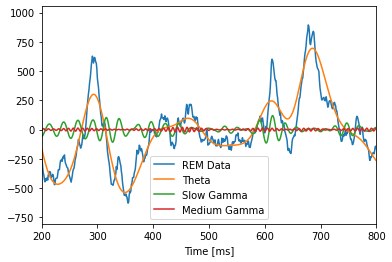

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


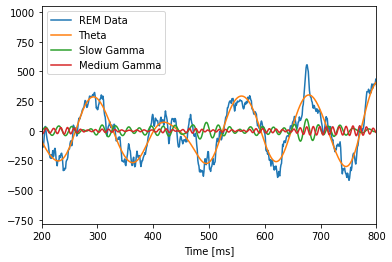

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


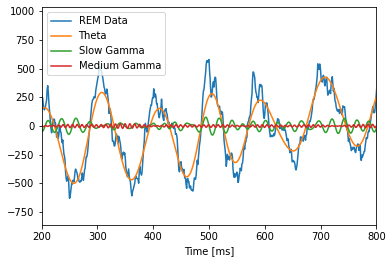

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


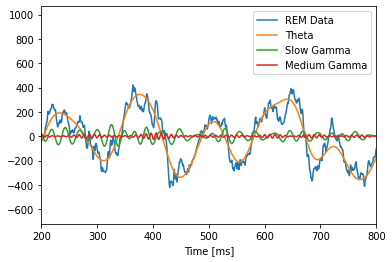

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


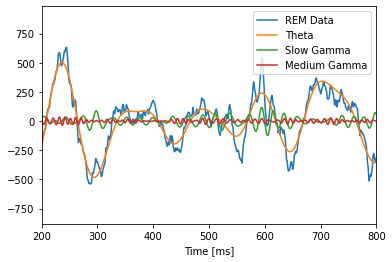

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


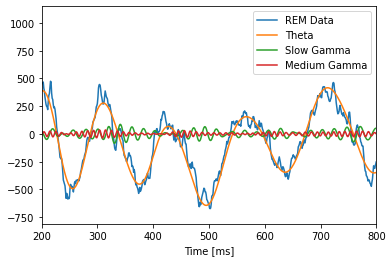

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


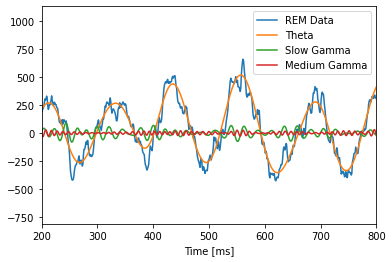

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


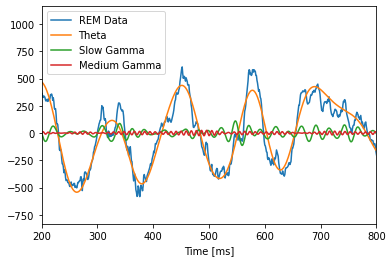

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


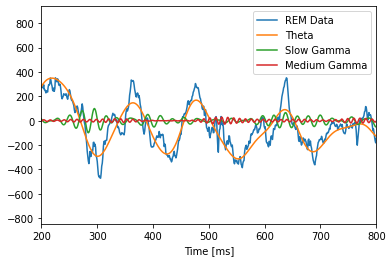

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


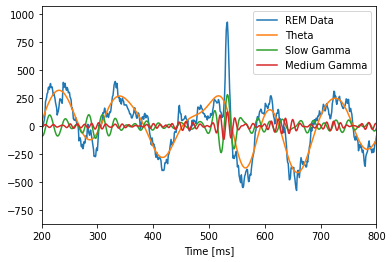

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


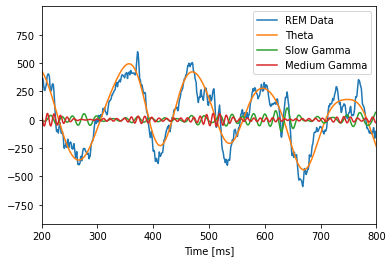

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


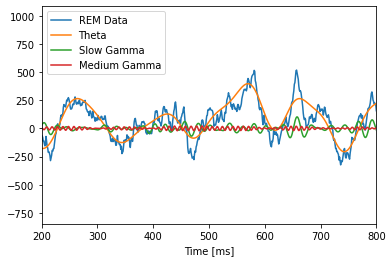

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


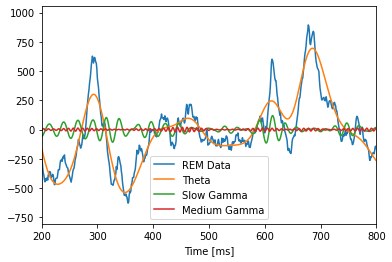

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


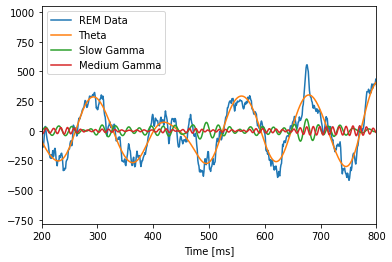

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


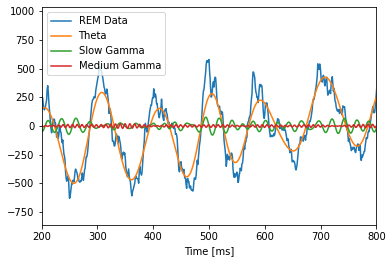

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


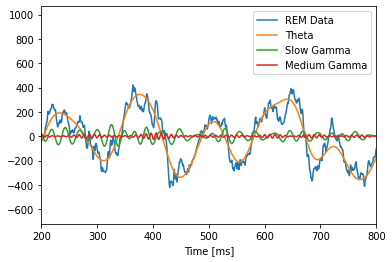

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


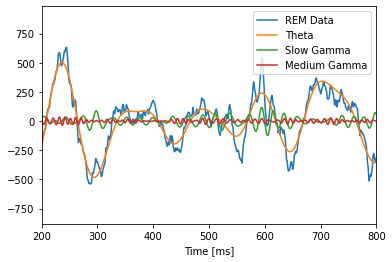

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


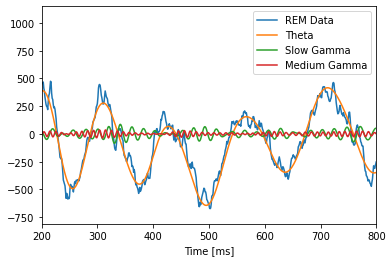

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


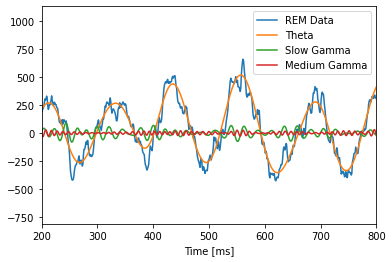

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


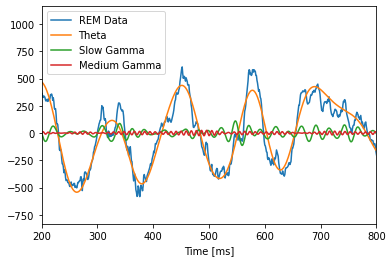

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


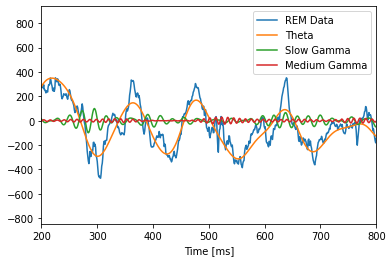

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


Rat 3


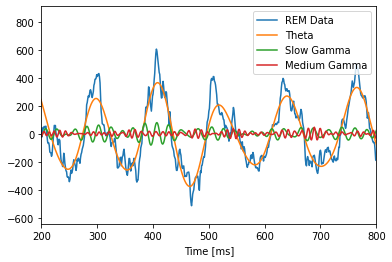

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


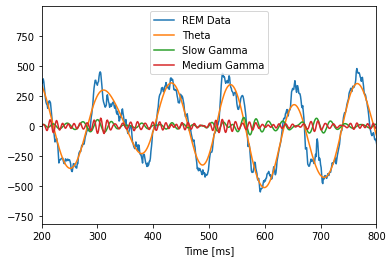

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


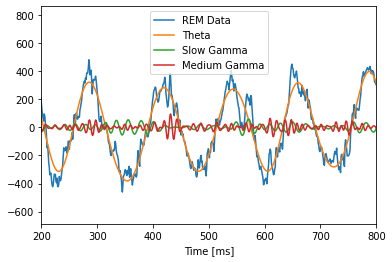

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


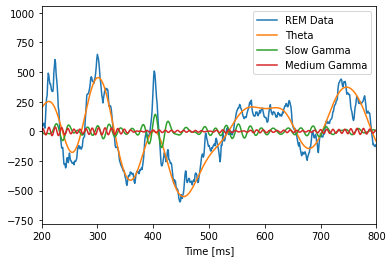

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


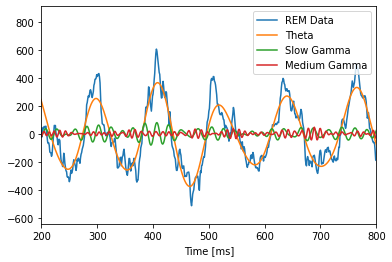

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


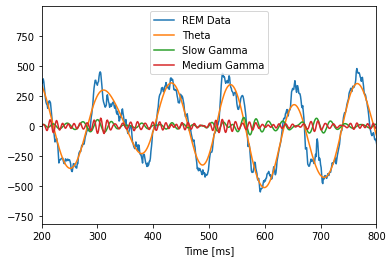

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


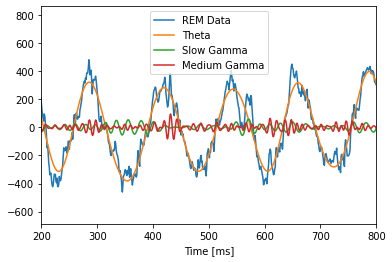

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


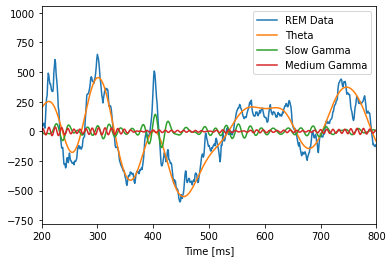

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


Rat 4


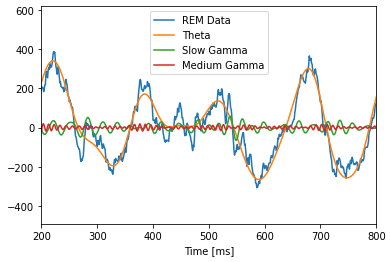

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


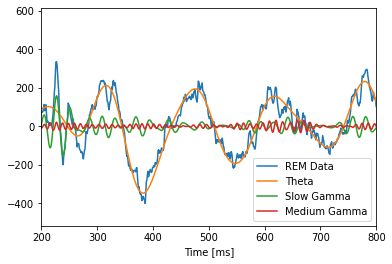

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


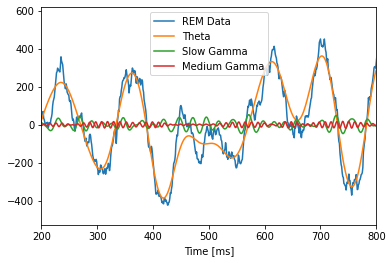

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


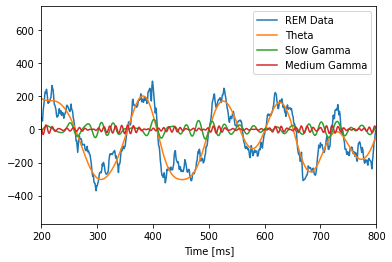

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


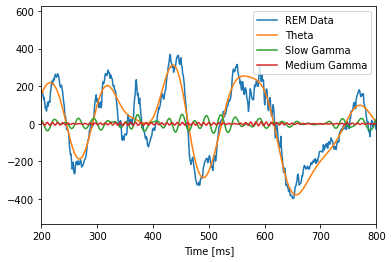

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


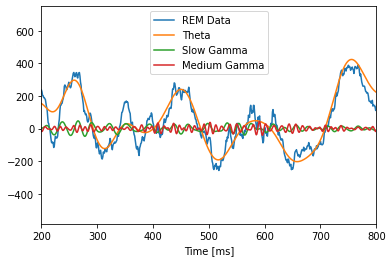

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


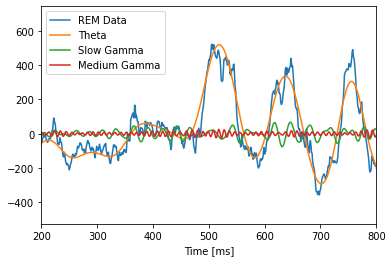

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


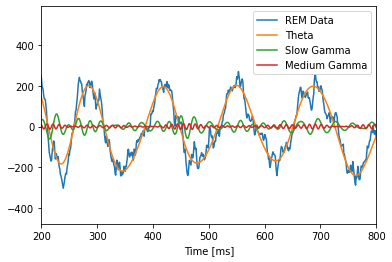

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


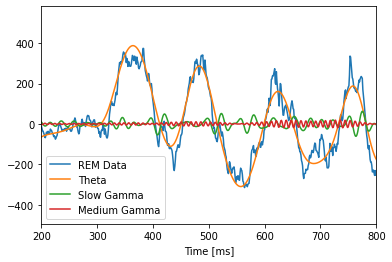

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


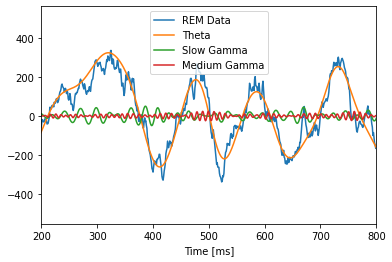

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


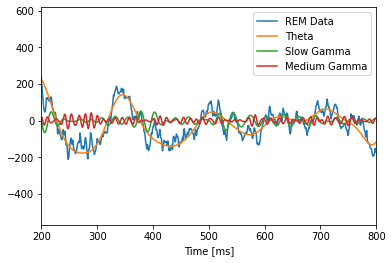

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


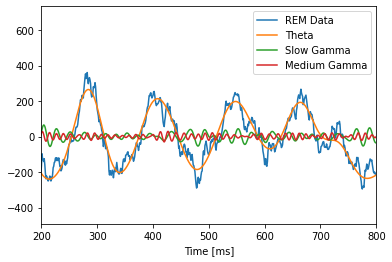

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


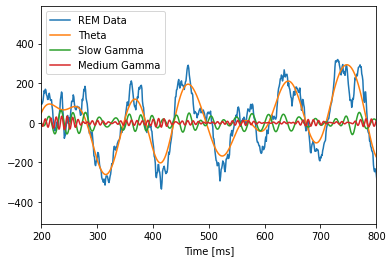

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


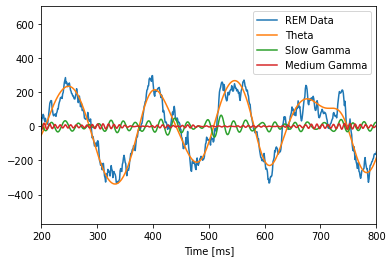

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


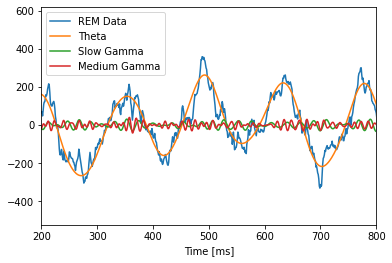

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


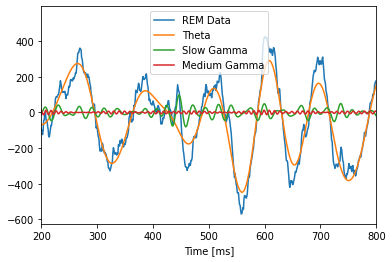

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


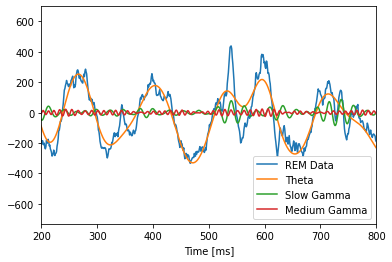

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


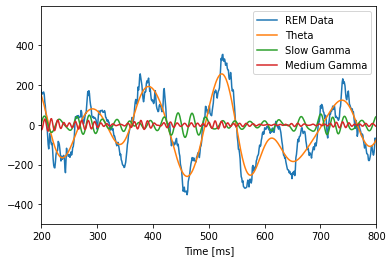

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


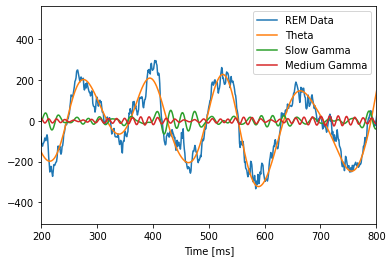

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


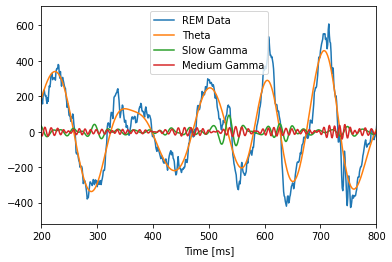

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


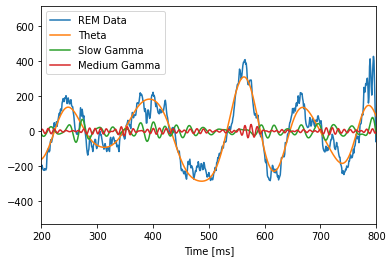

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


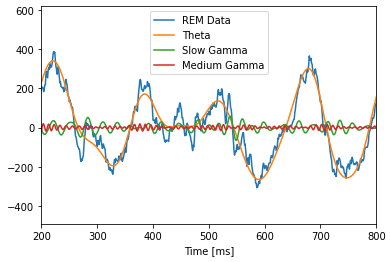

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


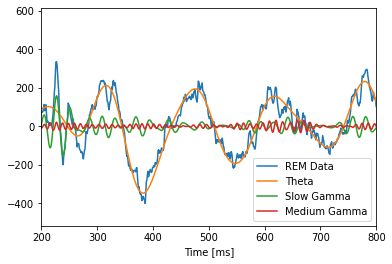

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


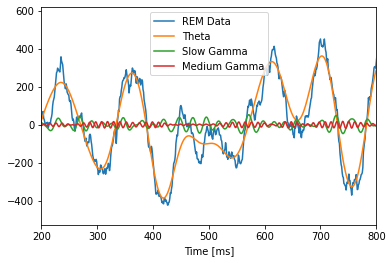

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


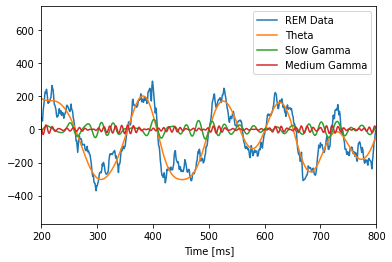

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


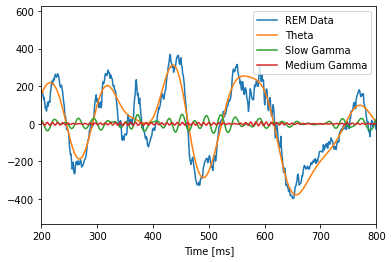

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


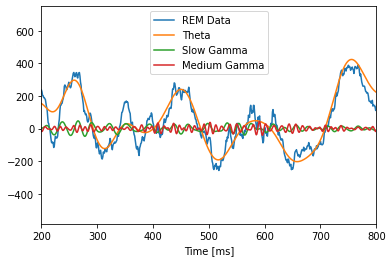

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


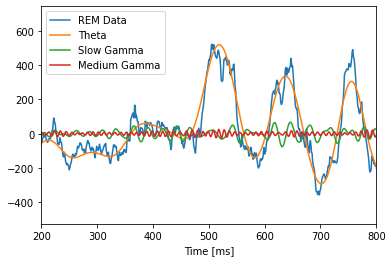

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


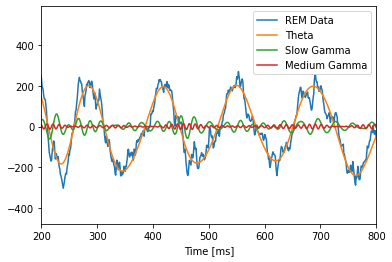

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


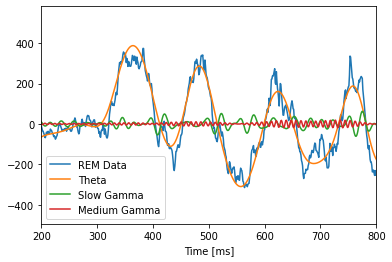

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


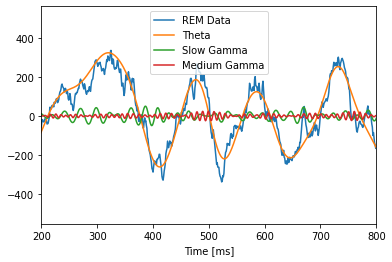

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


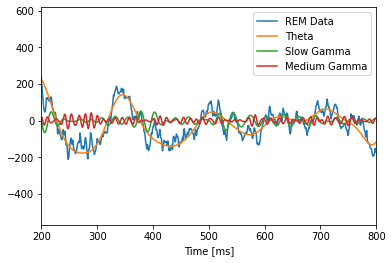

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


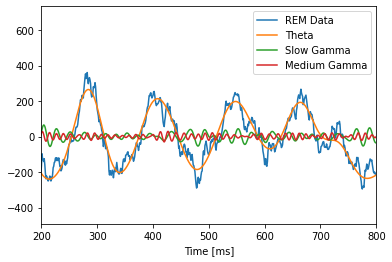

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


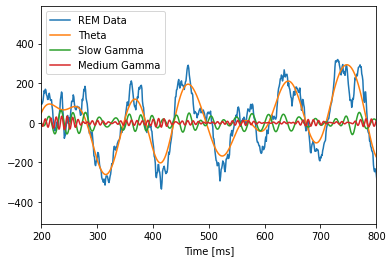

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


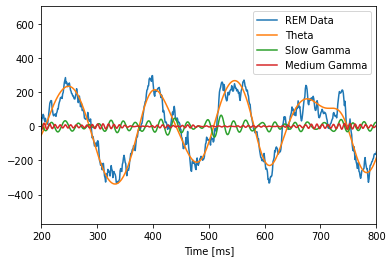

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


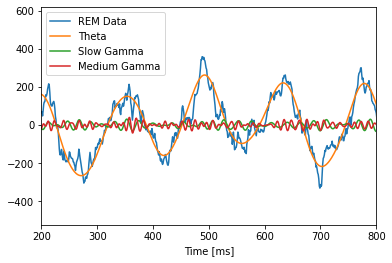

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


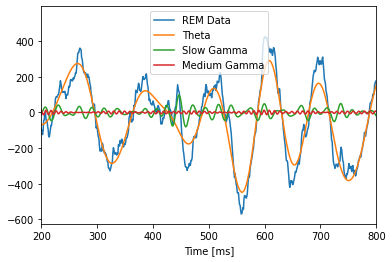

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


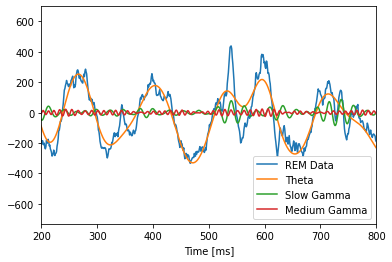

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


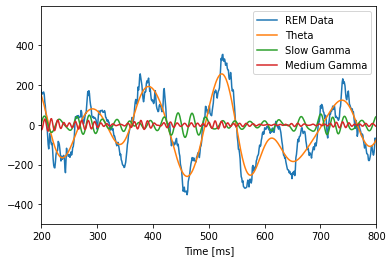

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


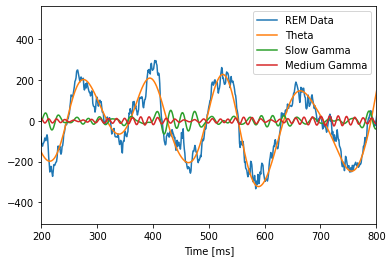

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


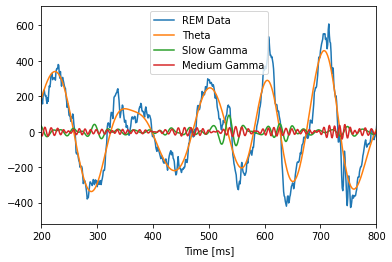

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


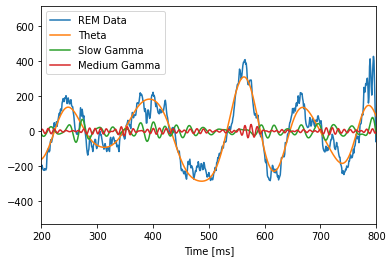

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


Rat 6


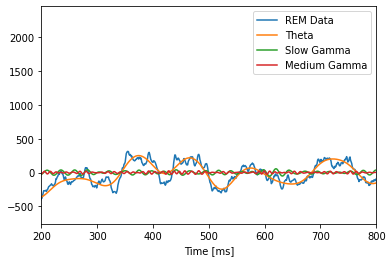

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


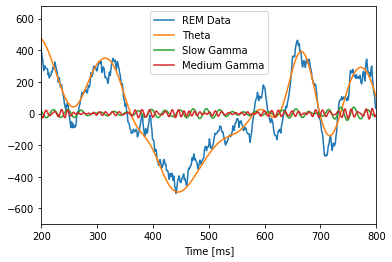

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


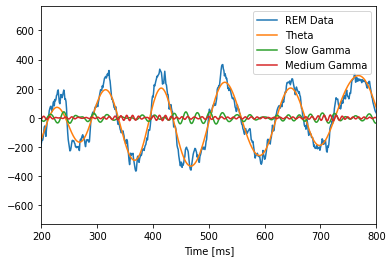

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


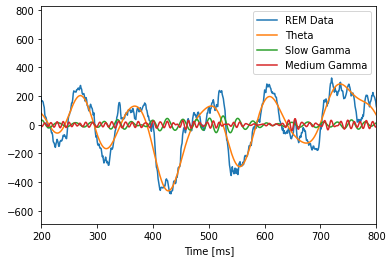

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


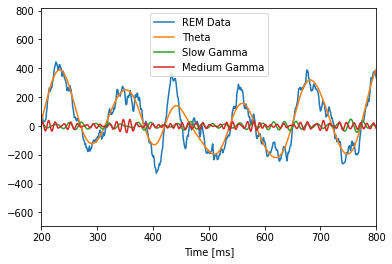

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


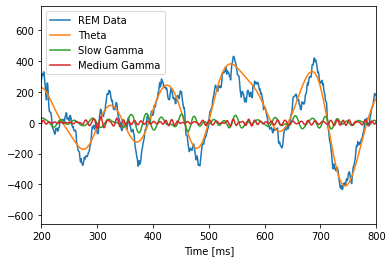

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


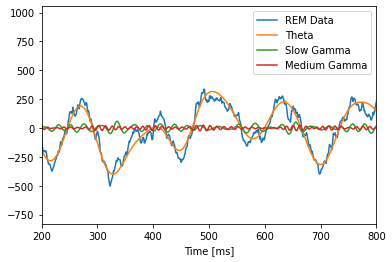

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


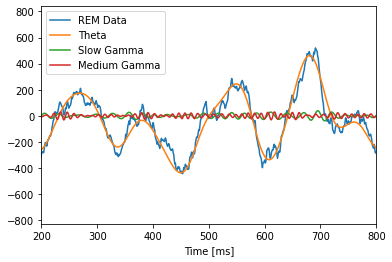

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


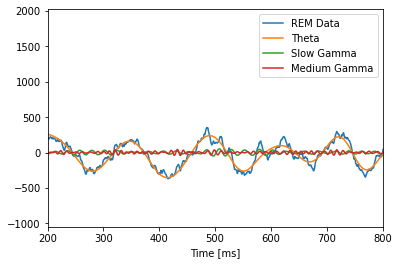

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


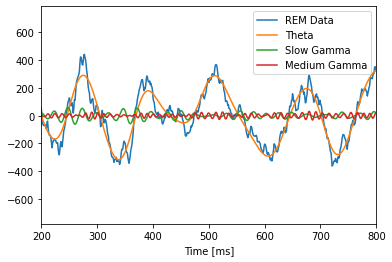

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


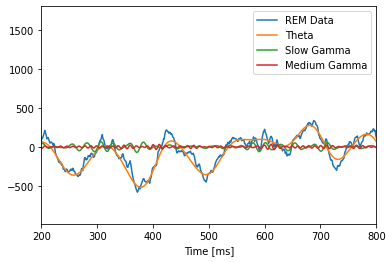

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


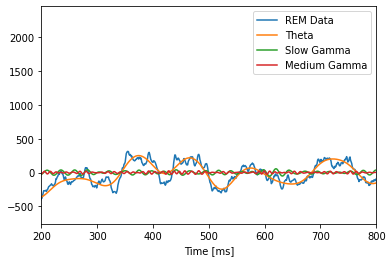

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


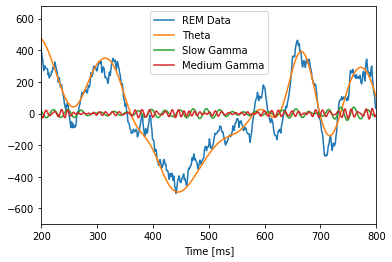

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


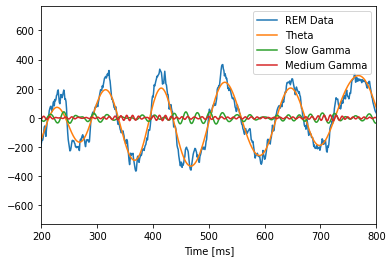

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


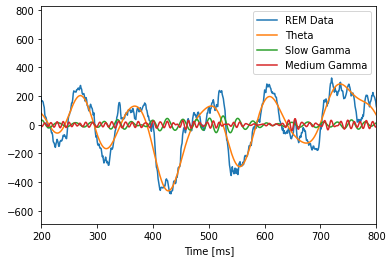

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


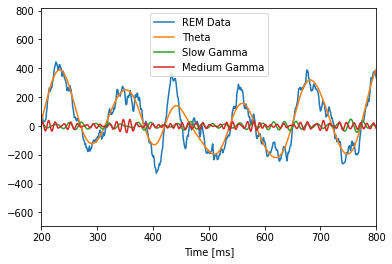

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


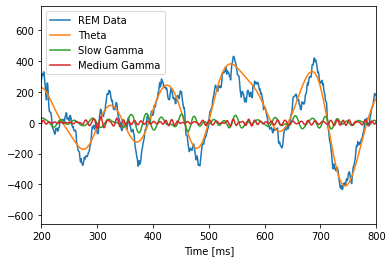

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


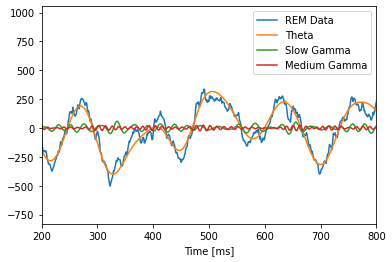

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


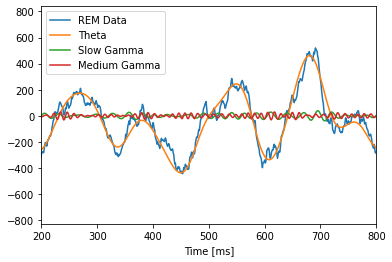

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


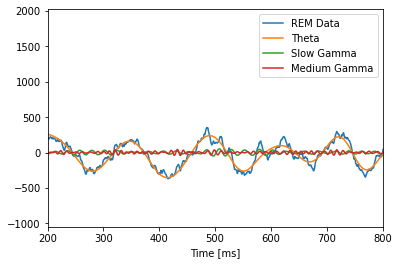

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


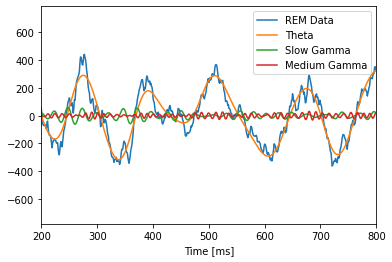

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


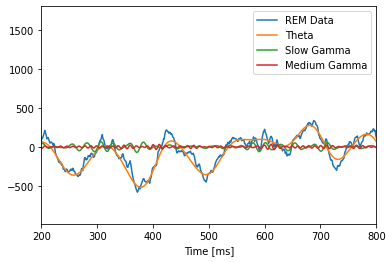

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


Rat 7


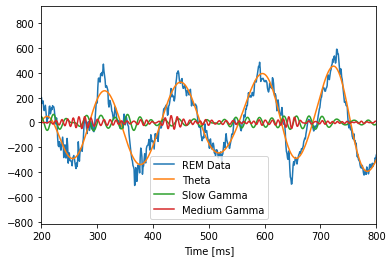

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


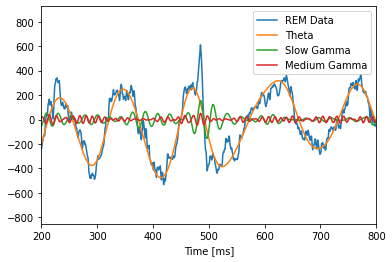

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


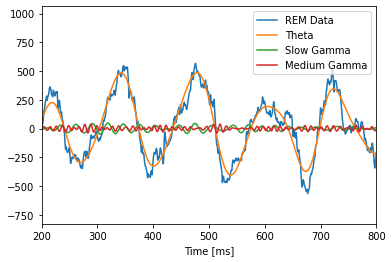

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


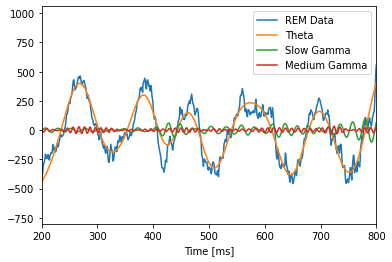

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


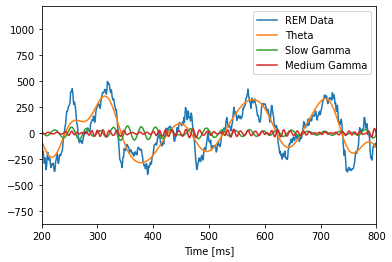

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


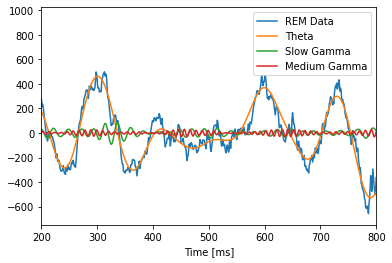

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


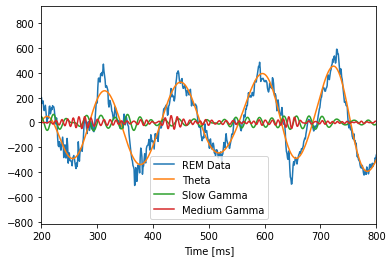

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


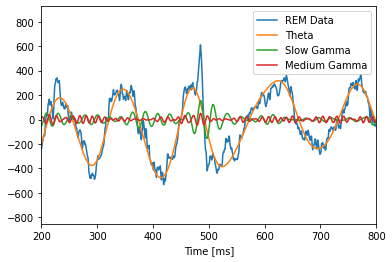

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


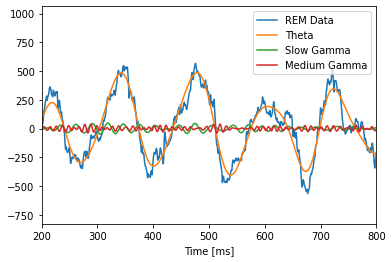

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


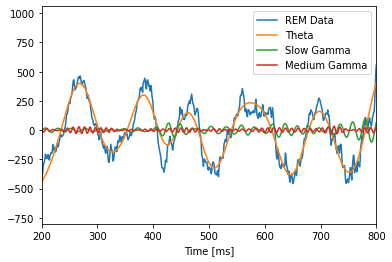

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


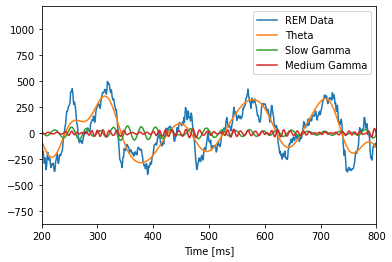

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


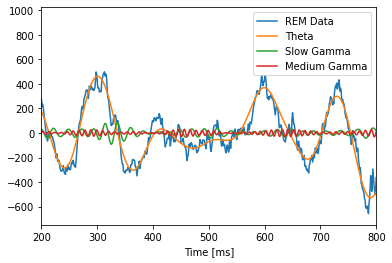

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


Rat 8


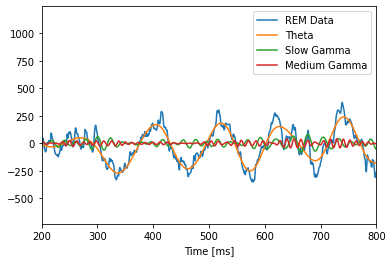

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


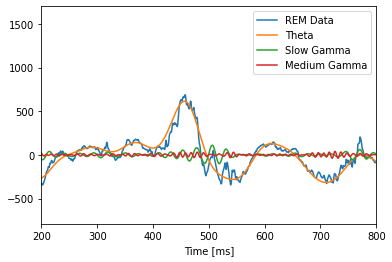

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


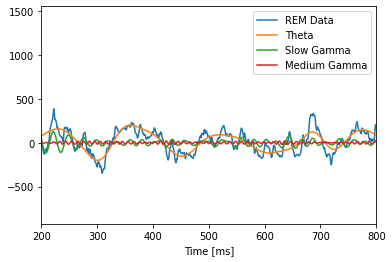

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


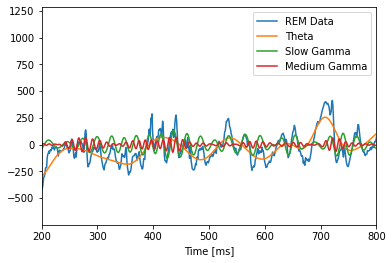

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


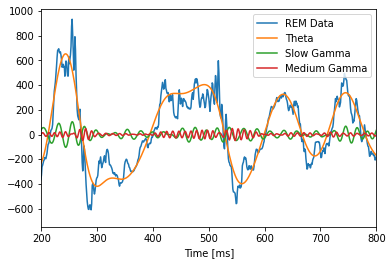

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


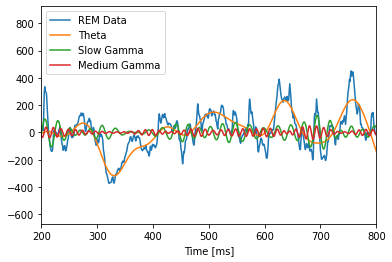

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


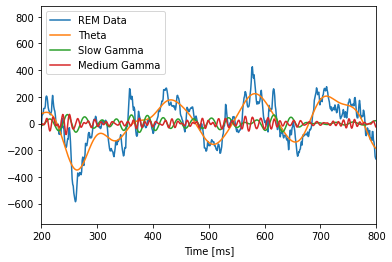

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


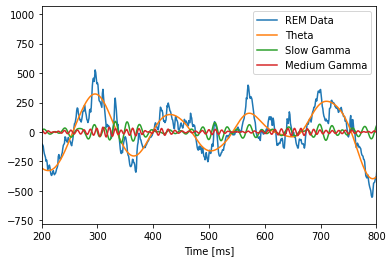

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


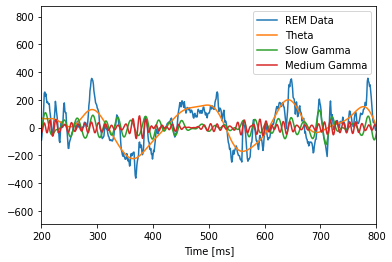

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


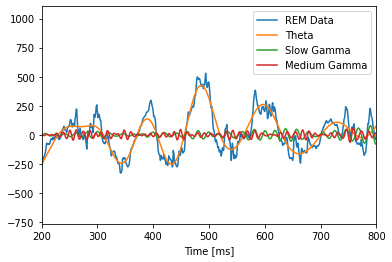

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


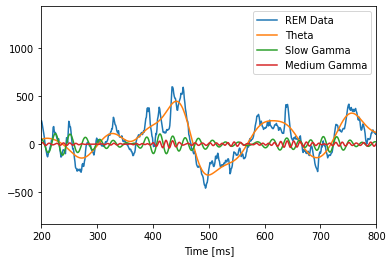

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


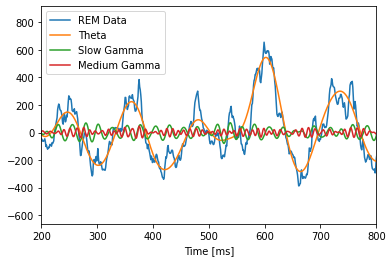

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


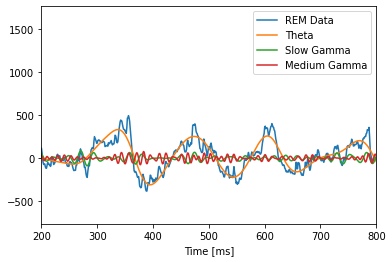

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


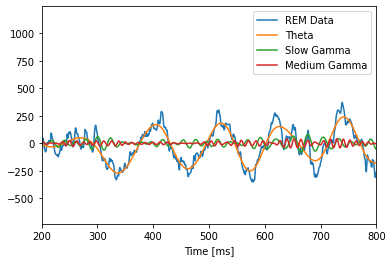

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


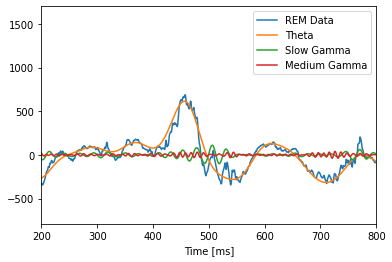

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


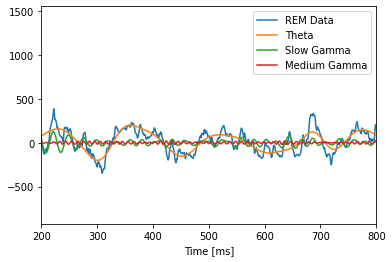

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


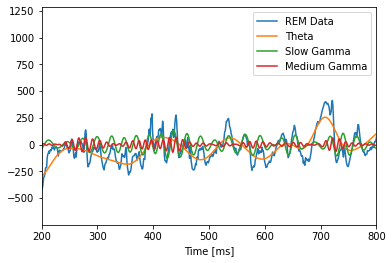

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


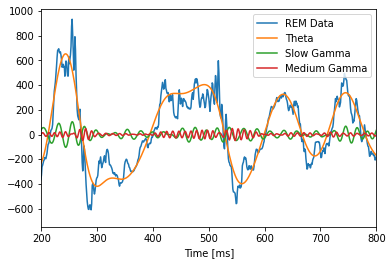

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


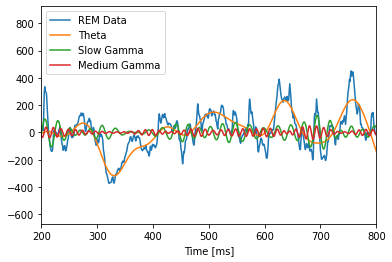

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


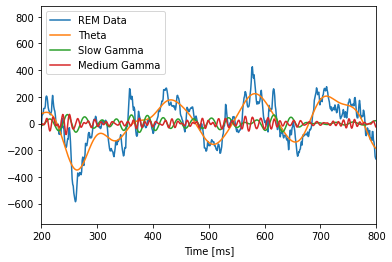

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


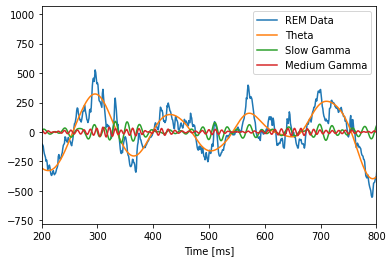

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


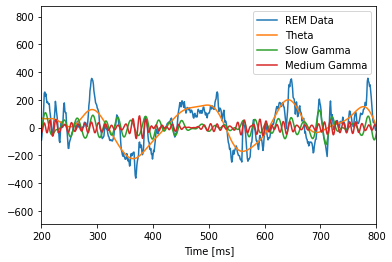

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


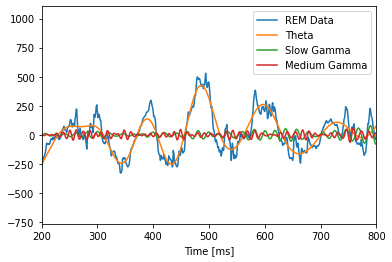

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


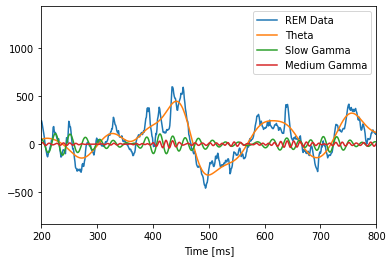

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


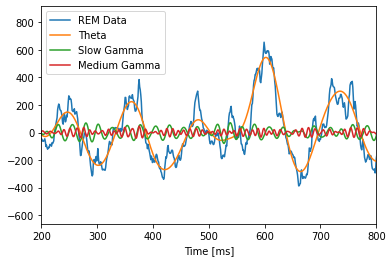

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


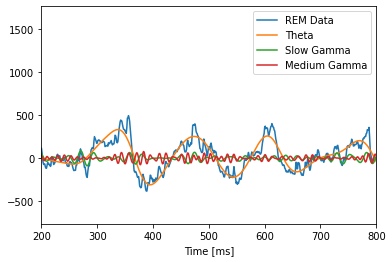

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


Rat 9


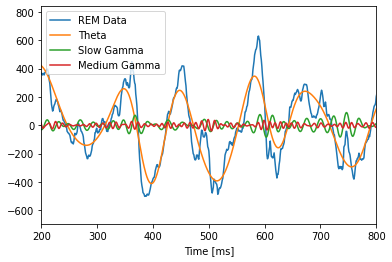

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


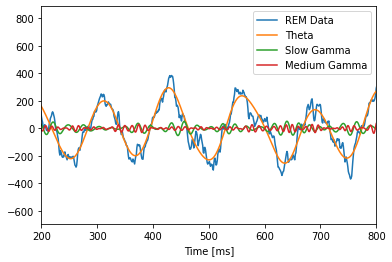

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


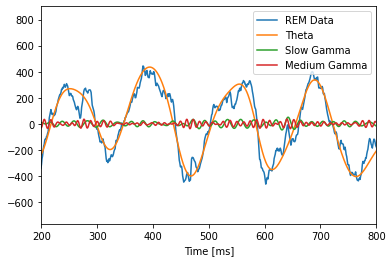

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


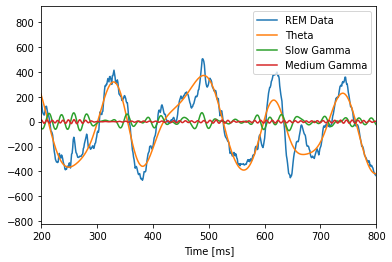

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


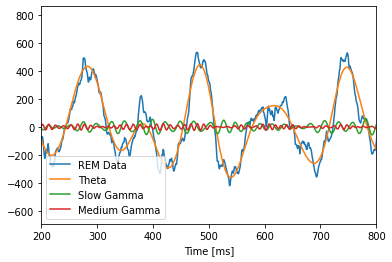

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


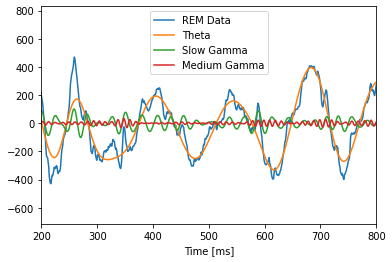

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


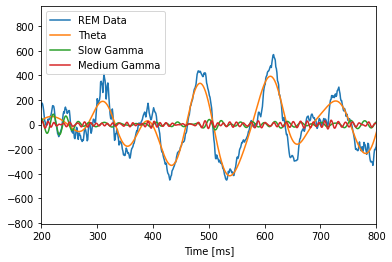

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


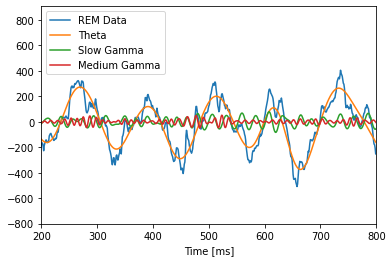

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


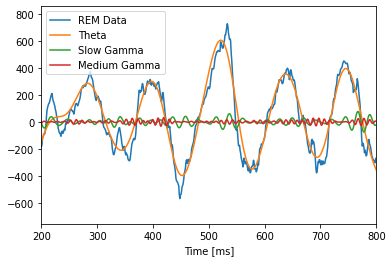

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


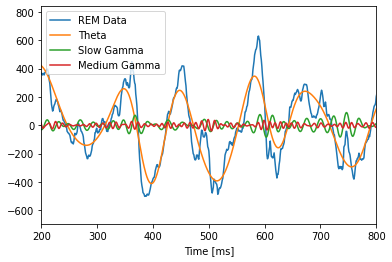

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


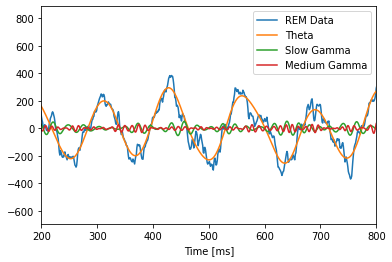

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


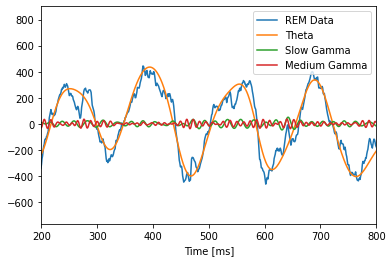

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


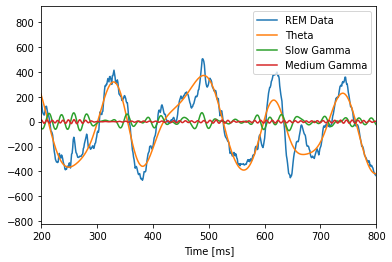

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


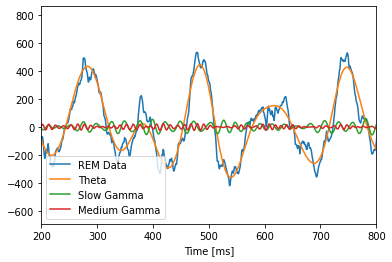

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


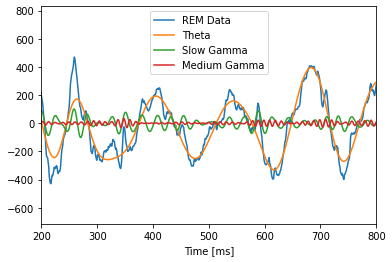

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


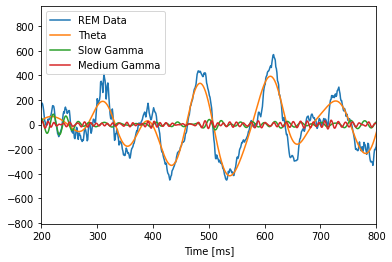

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


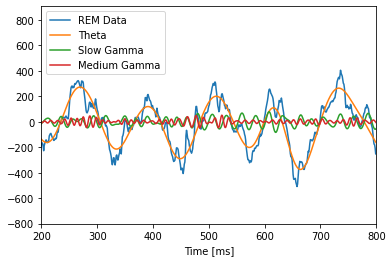

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


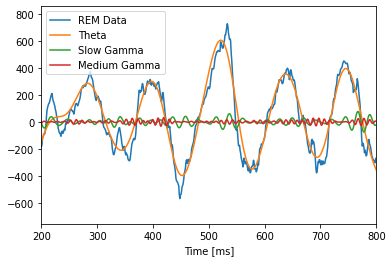

/tmp/ipykernel_79482/3872742948.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


In [6]:
for rat in range(1,10):
    if rat!=5:
        print('Rat', rat)
        epochs = df_average.loc[(df_average.Rat==rat),'Epoch']
#         print(epoch)
        for e in epochs:
            specp = df_average.loc[((df_average.Rat==rat)&(df_average.Epoch==e) & (df_average.Region=='HPC')), 'Spectral Analysis Power'].values[0]
            specp = np.array([float(num) for num in specp.split(',')[1:-1]])
#             print(specp[0])
            specf =df_average.loc[((df_average.Rat==rat) &(df_average.Epoch==e) & (df_average.Region=='HPC')),'Spectral Analysis Frequency'].values[0]
            specf =  np.array([float(num) for num in specf.split(',')[1:-1]])
            data = df_average.loc[((df_average.Rat==rat) &(df_average.Epoch==e) & (df_average.Region=='HPC')),'REM_Data'].values[0]
            data =  [float(num) for num in data.split(',')[1:-1]]
            theta =True
            slowgamma = True
            mediumgamma = True
            fastgamma = True
            df_filtered=df_filtered.append(spikes(rat,e,'HPC',specp,specf, data, theta,slowgamma, mediumgamma, fastgamma), ignore_index=True)


In [1]:
df_filtered

NameError: name 'df_filtered' is not defined

In [21]:
df_filtered.to_csv('Merged_FilteredBands_2_100_500_10.csv', sep=',', index=False)

In [4]:
def get_theta(rat, region, df_average):
    print(rat)
    epochs = df_average.loc[(df_average.Rat==rat),'Epoch']
    ep_b =[]
    ep_amp=[]
    ep_data=[]
    ep_phase=[]
    ldata = df_average.loc[((df_average.Rat==rat) & (df_average.Region==region)),'REM_Data']
    
    lengths=[]
    for i in range(len(ldata)):
        ld= [float(num) for num in ldata.values[i].split(',')[1:-1]]
        lengths.append(len(ld))

    d =  int(np.array(lengths).mean())
    for e in epochs:
        data = df_average.loc[((df_average.Rat==rat) &(df_average.Epoch==e)& (df_average.Region==region)),'REM_Data'].values[0]
        data =  [float(num) for num in data.split(',')[1:-1]]
        if len(data)>d:
            specp = df_average.loc[((df_average.Rat==rat) &(df_average.Epoch==e)& (df_average.Region==region)), 'Spectral Analysis Power'].values[0]
            specp = np.array([float(num) for num in specp.split(',')[1:-1]])[:d]
            specf =df_average.loc[((df_average.Rat==rat) &(df_average.Epoch==e)& (df_average.Region==region)),'Spectral Analysis Frequency'].values[0]
            specf =  np.array([float(num) for num in specf.split(',')[1:-1]])[:d]
            mc = df_average.loc[((df_average.Rat==rat) &(df_average.Epoch==e)& (df_average.Region==region)),'MC'].values[0]
            data = data[:d]
            extrema =specf[argrelextrema(specp, np.greater)]
            check_low = np.inf 
            check_high=0
            fNQ= 500
            plot(data, label=' Data')
            theta_lower = t_lower = 4
            theta_upper = t_higher = 12
            for theta_e in extrema:
                if theta_e >=theta_lower and theta_e< theta_upper:
                    if theta_e < check_low:
                        check_low = theta_e
                        t_lower =theta_e
                    elif theta_e > check_high:
                        check_high = theta_e
                        t_higher =theta_e
            Wn = [t_lower, t_higher];                     # Set the passband [80-120] Hz,
            n = 100;                            # ... and filter order,
            b = signal.firwin(n, Wn, nyq=fNQ, pass_zero=False, window='hamming');       
            Vlo = signal.filtfilt(b, 1, data);   # ... and apply it to the data.
            ep_phase.append(angle(signal.hilbert(Vlo)))
            ep_amp.append(abs(signal.hilbert(Vlo)))
            ep_b.append(Vlo)
#             print(shape(data))
            ep_data.append(data)
    return {'Rat':rat,'Region':region, 'MC': mc,'Phase':ep_phase, 'Amplitude':ep_amp, 'Filtered':ep_b, 'REM_Data':ep_data}

1


/tmp/ipykernel_4501/593672393.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'HPC', df_average), ignore_index=True)


1


/tmp/ipykernel_4501/593672393.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'PFC', df_average), ignore_index=True)


2


/tmp/ipykernel_4501/593672393.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'HPC', df_average), ignore_index=True)


2


/tmp/ipykernel_4501/593672393.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'PFC', df_average), ignore_index=True)


3


/tmp/ipykernel_4501/593672393.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'HPC', df_average), ignore_index=True)


3


/tmp/ipykernel_4501/593672393.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'PFC', df_average), ignore_index=True)


4


/tmp/ipykernel_4501/593672393.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'HPC', df_average), ignore_index=True)


4


/tmp/ipykernel_4501/593672393.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'PFC', df_average), ignore_index=True)


6


/tmp/ipykernel_4501/593672393.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'HPC', df_average), ignore_index=True)


6


/tmp/ipykernel_4501/593672393.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'PFC', df_average), ignore_index=True)


7


/tmp/ipykernel_4501/593672393.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'HPC', df_average), ignore_index=True)


7


/tmp/ipykernel_4501/593672393.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'PFC', df_average), ignore_index=True)


8


/tmp/ipykernel_4501/593672393.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'HPC', df_average), ignore_index=True)


8


/tmp/ipykernel_4501/593672393.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'PFC', df_average), ignore_index=True)


9


/tmp/ipykernel_4501/593672393.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'HPC', df_average), ignore_index=True)


9


/tmp/ipykernel_4501/593672393.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  theta_values = theta_values.append(get_theta(rat,'PFC', df_average), ignore_index=True)


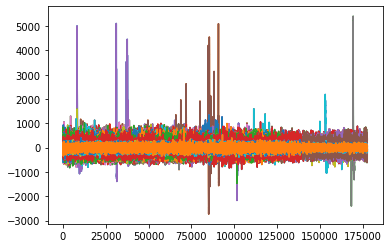

In [5]:
theta_values= pd.DataFrame(columns=['Rat','Region','MC','Phase', 'Amplitude','Filtered', 'REM_Data'])
theta_values['Phase']=theta_values['Phase'].astype(object)
theta_values['Amplitude']=theta_values['Amplitude'].astype(object)
theta_values['Filtered']=theta_values['Filtered'].astype(object)
theta_values['REM_Data']=theta_values['REM_Data'].astype(object)
rats=list({r for r in df_average.Rat.values})
for rat in rats:
    if rat!=5:     
        theta_values = theta_values.append(get_theta(rat,'HPC', df_average), ignore_index=True)
        theta_values = theta_values.append(get_theta(rat,'PFC', df_average), ignore_index=True)

#         theta_values = theta_values.append(get_theta(rat,'HPC',df_average), ignore_index=True)


In [ ]:
from sklearn.decomposition import PCA


In [8]:
theta_values

,Rat,Region,MC,Phase,Amplitude,Filtered,REM_Data
0,1,HPC,Control,"[[-1.303788914093433, -1.0508162907357068, -1....","[[709.4861267647393, 359.75185444750645, 353.2...","[[187.1951320020724, 178.747318258274, 170.285...","[[151.8565932605078, 168.0878568053604, 187.32..."
1,1,PFC,Control,"[[1.9647122553468392, 2.433992975520347, 2.381...","[[143.45674878928088, 71.59912738119304, 74.15...","[[-55.05975727030529, -54.40991680707248, -53....","[[-57.494348896416, -36.17112036650811, -20.77..."
2,2,HPC,Control,"[[2.8038048492129364, -3.032921936465403, -3.0...","[[390.15957712272217, 367.72205057302705, 364....","[[-368.1116971800633, -365.5529119475668, -362...","[[-298.61988223331167, -327.55533429565384, -3..."
3,2,PFC,Control,"[[2.2384653479329657, 2.543762660748205, 2.561...","[[609.8251419438956, 445.7313894481816, 429.41...","[[-377.5776456125055, -368.423268769077, -359....","[[-306.29885692435437, -299.5435062316774, -28..."
4,3,HPC,Mutation,"[[-1.9910537643887536, -2.4989995303960444, -2...","[[235.34812393461874, 130.05861352368987, 138....","[[-96.0209761965185, -104.11770272802674, -112...","[[-77.89421749808209, -106.31214174809068, -69..."
5,3,PFC,Mutation,"[[-1.246010885503088, -1.1910576057135267, -1....","[[105.6996186514426, 84.68241385241612, 80.827...","[[33.72932456412957, 31.389892242713266, 29.05...","[[27.369150352456053, 21.17073631604076, -6.70..."
6,4,HPC,Mutation,"[[-1.332594287226298, -1.2621777826223202, -1....","[[261.82651631934044, 202.54404939072512, 195....","[[61.77948928704025, 61.5212843325496, 61.2386...","[[50.11680953541094, 70.23030504500609, 62.418..."
7,4,PFC,Mutation,"[[-1.176509570885551, -0.8154671195956854, -0....","[[467.25200497851296, 249.32706631657774, 243....","[[179.49474984250162, 170.92078079793686, 162....","[[151.61092031091184, 149.3407903848965, 123.6..."
8,6,HPC,Control,"[[-2.6425506267874606, -2.8544202662966933, -2...","[[270.7835809948203, 248.2684235198266, 251.37...","[[-237.75920428894582, -238.10148544447247, -2...","[[-192.87522273415055, -172.90630396666023, -1..."
9,6,PFC,Control,"[[1.857794496514281, 2.00531892494958, 2.00688...","[[874.9575606487163, 593.1657686801783, 595.93...","[[-247.67813514363962, -249.70939014390746, -2...","[[-200.92166620877924, -223.77631267730996, -1..."


In [7]:
import sys
np.set_printoptions(threshold=sys.maxsize)


TV=theta_values.to_dict("list")

savemat('../Theta_Values.mat',{'structs': TV})
# theta_values.to_csv('Theta_Values.csv')